#D3D Minimum Fisher Regularization

In [1]:
using PyPlot
include("src/netcdf.jl")
include("src/utils.jl")
include("src/gradients.jl")
include("src/linreg.jl")

INFO: Loading help data...


linRegEP (generic function with 1 method)

In [2]:
function min_fisher_analysis(dist_name,device;nenergy=15,npitch=15,elevel=2,doplot=false)
    test_dists = read_ncdf("data/test_distributions.cdf");
    data = read_ncdf("data/"*device*"_test_data.cdf");
    wf   = read_ncdf("data/"*device*"_transfer_matrix.cdf");
    
    dist_full = test_dists[dist_name]
    A_full = wf["transfer_matrix"]
    energy_full = wf["energy"]
    pitch_full  = wf["pitch"]
    
    A,energy,pitch = resizeTransferMatrix(A_full,energy_full,pitch_full,nenergy,npitch);
    dist = bilinear(dist_full,energy_full,pitch_full,energy,pitch);
    dE = abs(energy[2]-energy[1])
    dP = abs(pitch[2]-pitch[1]);

    spec = data[dist_name*"_spec"]
    err  = data[dist_name*"_err"]
    
    wf = 0
    data =0
    test_dists=0
    gc()
    
    f, rchisq, status= linRegEP(A,spec[:,elevel],err[:,elevel],energy,pitch,method=:MinFisher);
    dens = sum(f)
    rspec = A*f
    f = f./(dE*dP)
    df = (f .- reshape(dist,npitch*nenergy))
    
    if doplot
        ax1 = plt.subplot2grid((4,4),(0,0))
        ax2 = plt.subplot2grid((4,4),(0,1))
        ax3 = plt.subplot2grid((4,4),(1,0),colspan=2)
        ax = [ax1,ax2,ax3]
        fig = plt.gcf()
        fig[:set_size_inches](15,10)
        p1 = ax[1][:contourf](energy,pitch,reshape(f,npitch,nenergy),30)
        ax[1][:set_xlabel]("Energy [keV]")
        ax[1][:set_ylabel]("Pitch")
        ax[1][:set_title](dist_name*" "*string(round(0.05*(elevel-1),2)))

        max_delta = maximum(abs(df))
        p2 = ax[2][:contourf](energy,pitch,reshape(df,npitch,nenergy),30,vmin=-max_delta,vmax=max_delta,cmap = "bwr")
        ax[2][:set_xlabel]("Energy [keV]")
        ax[2][:set_ylabel]("Pitch")
        ax[2][:set_title](dist_name*" diff. "*string(round(0.05*(elevel-1),2)))

        ax[3][:plot](spec[:,elevel],"k",alpha=0.3)
        ax[3][:plot](spec[:,1],"k",label="True")
        s = @sprintf("%3.2E",mean(abs(spec[:,1]-rspec)))
        ax[3][:plot](rspec,"r",label="MAE = "*s)
        ax[3][:plot](spec[:,elevel].*0,"k-")
        ax[3][:set_xlabel]("Wavelength Index")
        ax[3][:set_ylabel]("Ph/(s*nm*sr*m²)")
        ax[3][:legend](fontsize=10)
        plt.colorbar(p1,ax=ax[1])
        plt.colorbar(p2,ax=ax[2])

        fig[:tight_layout]()
    end
    
    return f,df,dens
end

min_fisher_analysis (generic function with 1 method)

##Flat Distribution Reconstruction

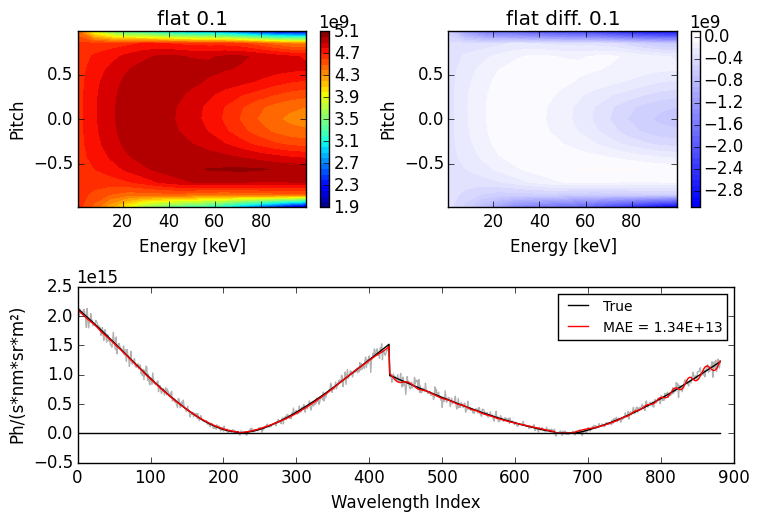

In [3]:
min_fisher_analysis("flat","d3d",elevel=3,doplot=true);

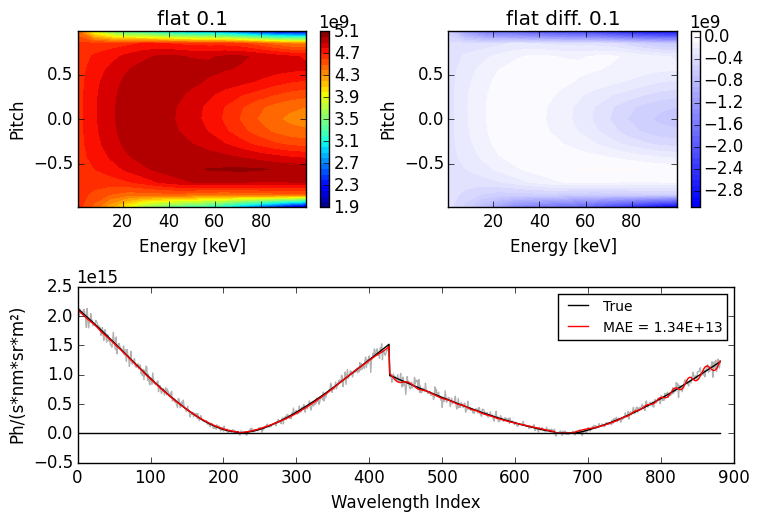

In [4]:
min_fisher_analysis("flat","d3d",elevel=3,doplot=true);

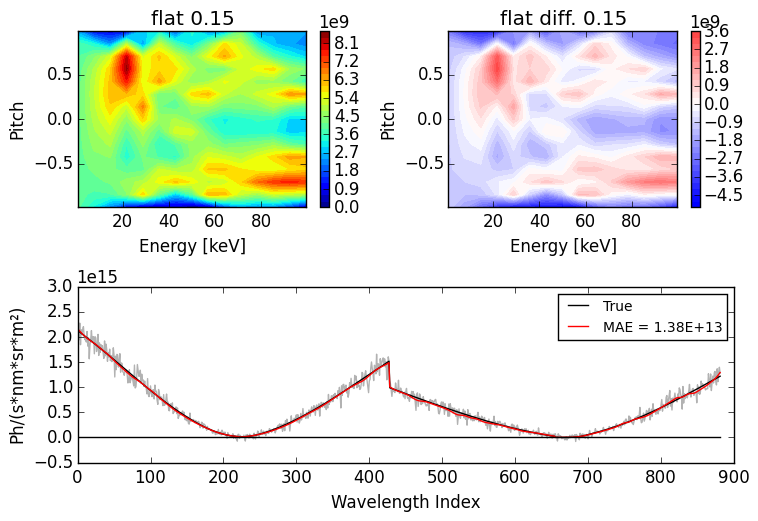

In [5]:
min_fisher_analysis("flat","d3d",elevel=4,doplot=true);

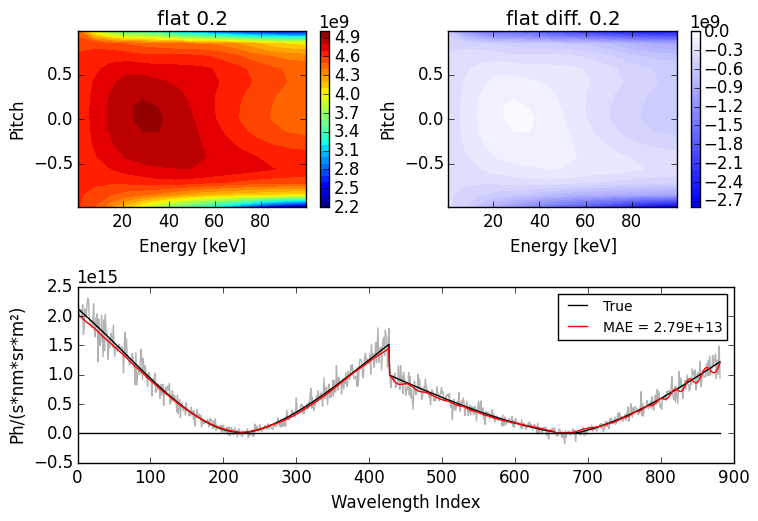

In [6]:
min_fisher_analysis("flat","d3d",elevel=5,doplot=true);

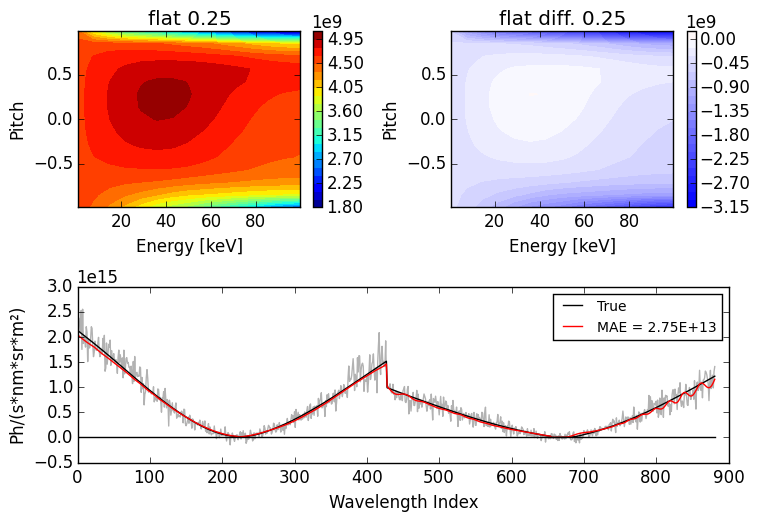

In [7]:
min_fisher_analysis("flat","d3d",elevel=6,doplot=true);

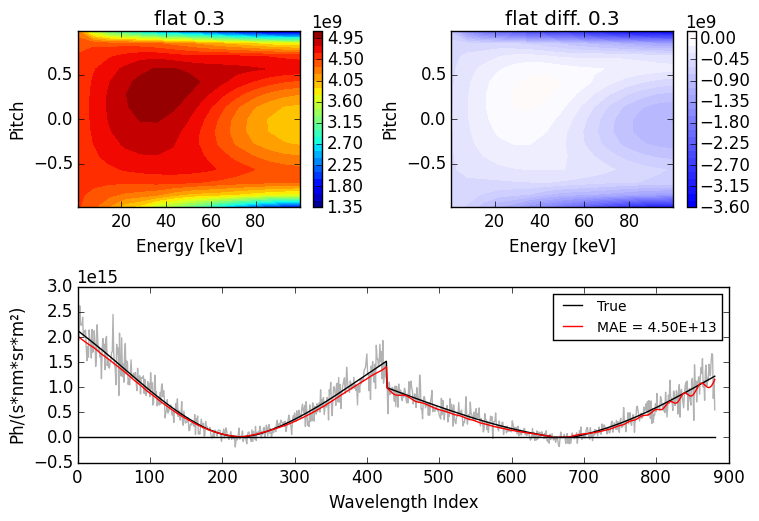

In [8]:
min_fisher_analysis("flat","d3d",elevel=7,doplot=true);

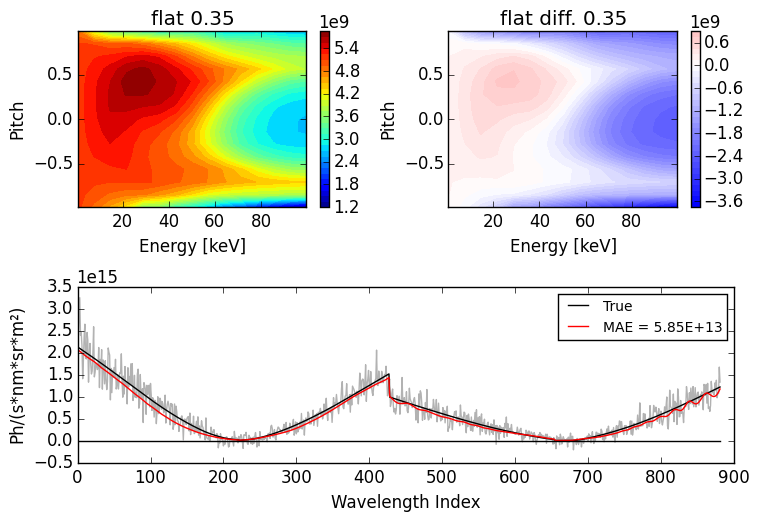

In [9]:
min_fisher_analysis("flat","d3d",elevel=8,doplot=true);

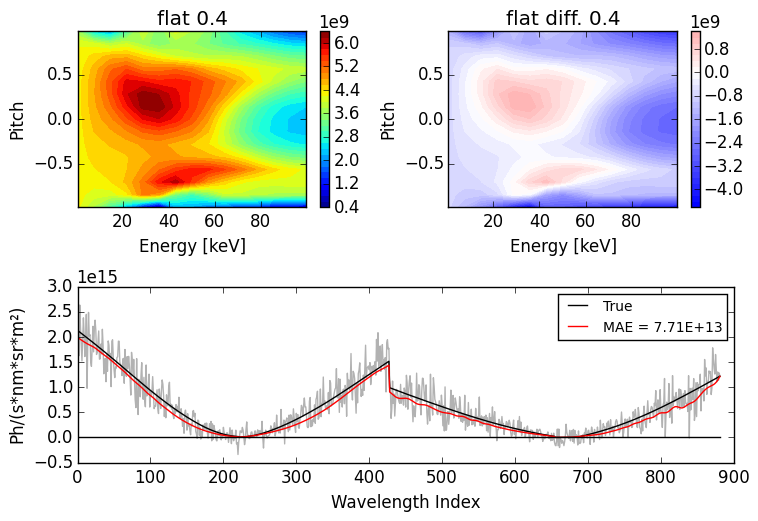

In [10]:
min_fisher_analysis("flat","d3d",elevel=9,doplot=true);

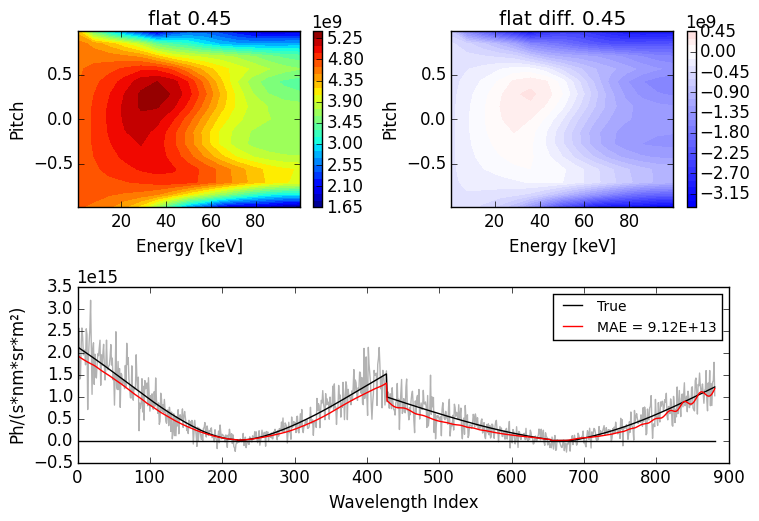

In [11]:
min_fisher_analysis("flat","d3d",elevel=10,doplot=true);

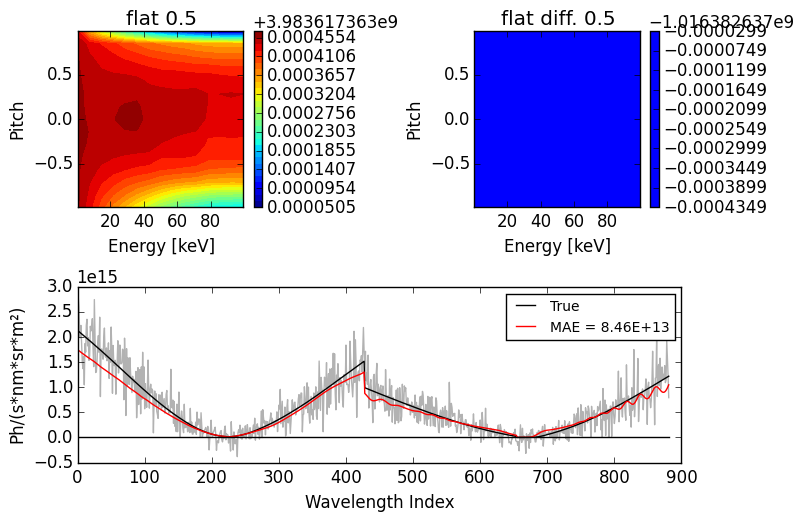

In [12]:
min_fisher_analysis("flat","d3d",elevel=11,doplot=true);

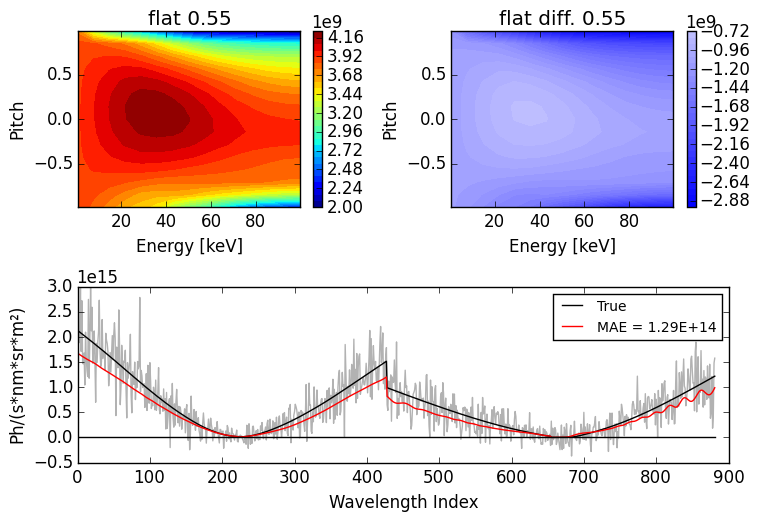

In [13]:
min_fisher_analysis("flat","d3d",elevel=12,doplot=true);

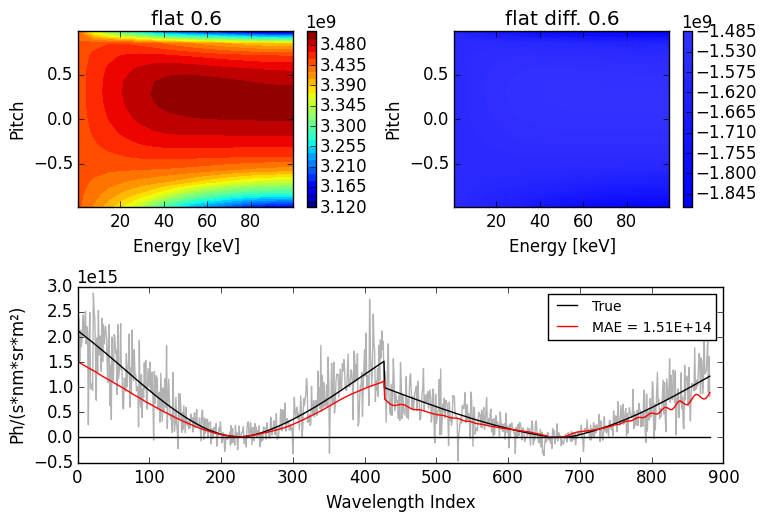

In [14]:
min_fisher_analysis("flat","d3d",elevel=13,doplot=true);

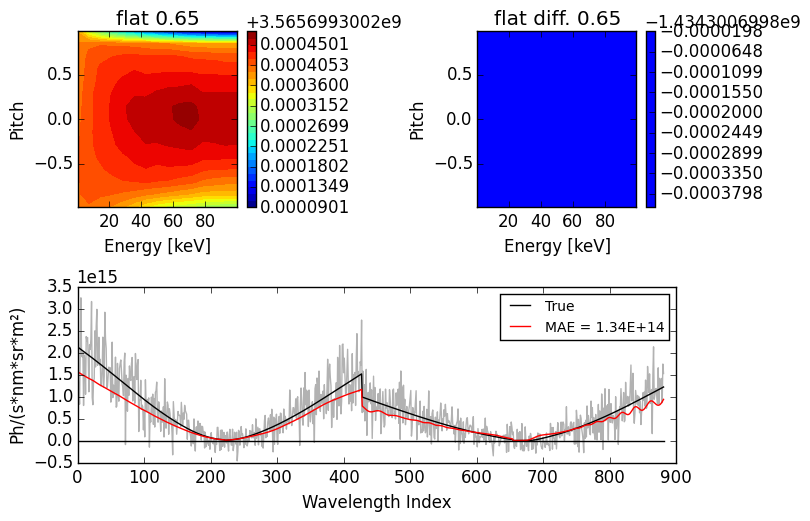

In [15]:
min_fisher_analysis("flat","d3d",elevel=14,doplot=true);

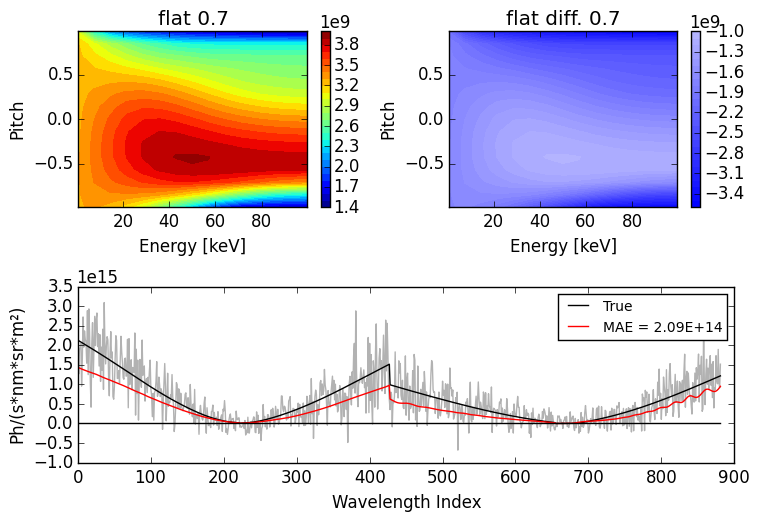

In [16]:
min_fisher_analysis("flat","d3d",elevel=15,doplot=true);

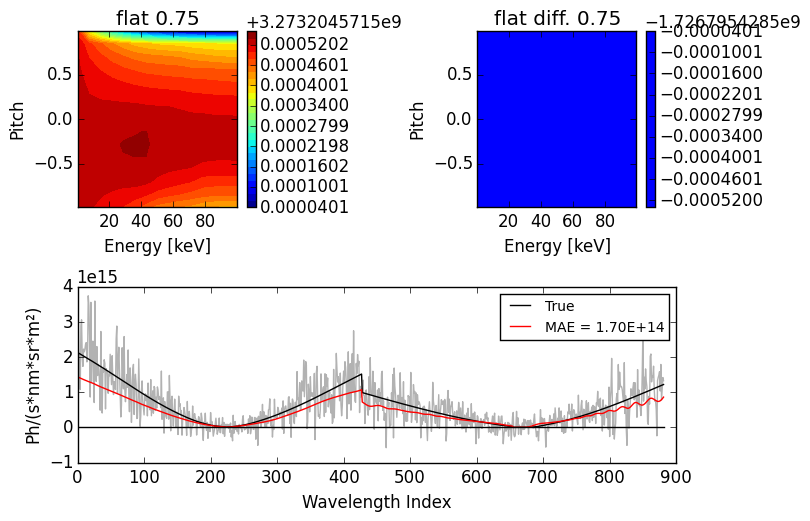

In [17]:
min_fisher_analysis("flat","d3d",elevel=16,doplot=true);

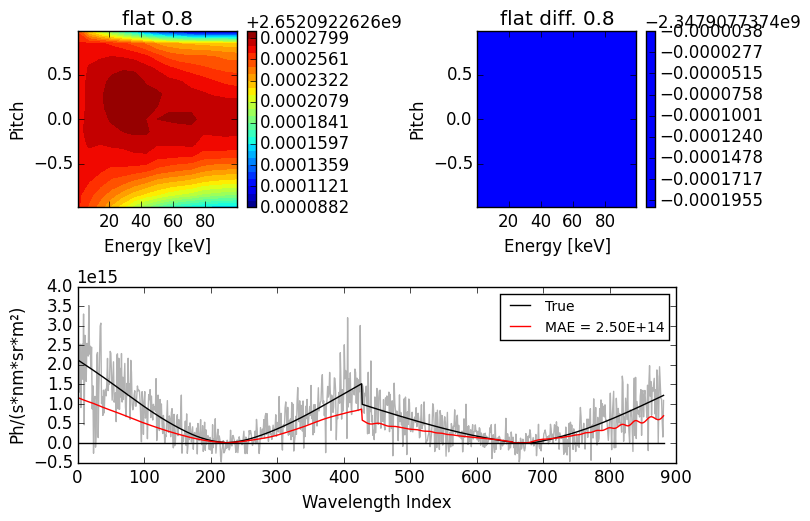

In [18]:
min_fisher_analysis("flat","d3d",elevel=17,doplot=true);

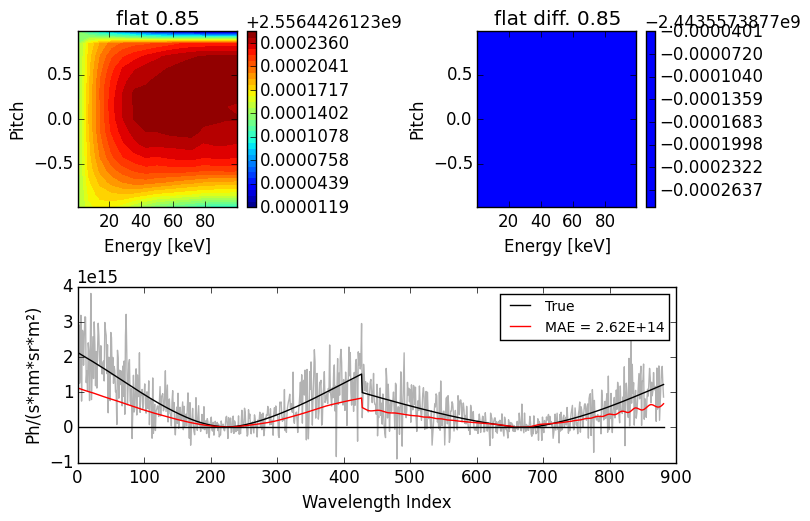

In [19]:
min_fisher_analysis("flat","d3d",elevel=18,doplot=true);

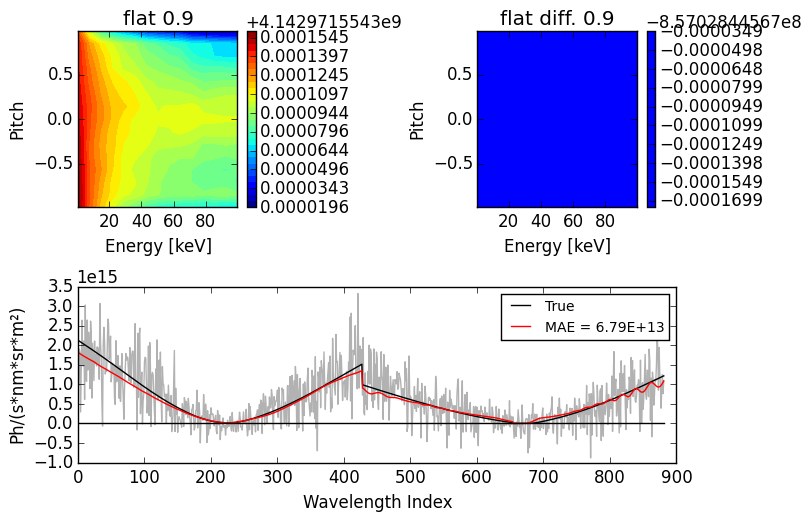

In [20]:
min_fisher_analysis("flat","d3d",elevel=19,doplot=true);

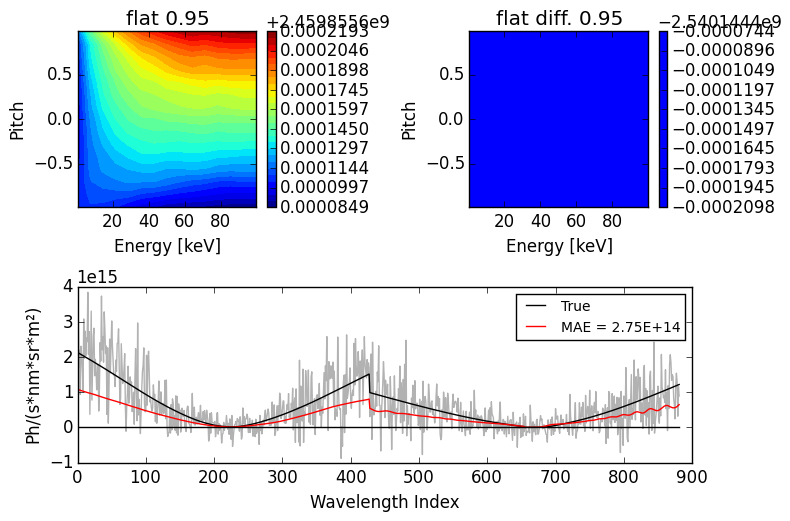

In [21]:
min_fisher_analysis("flat","d3d",elevel=20,doplot=true);

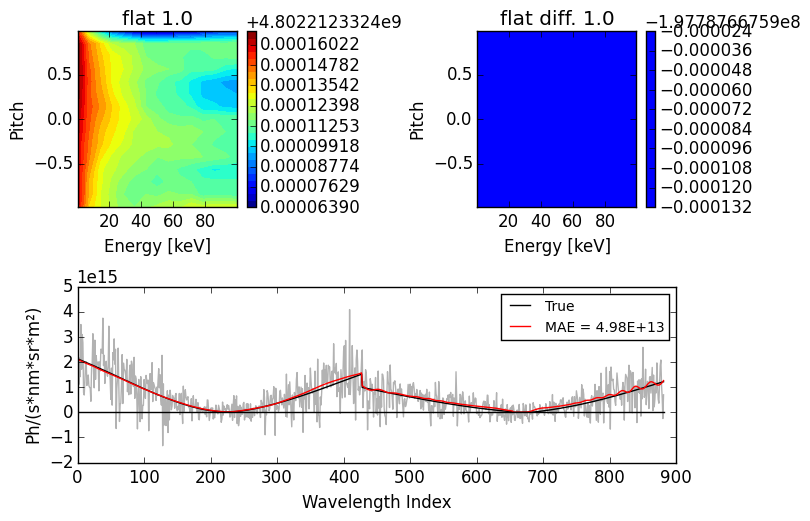

In [22]:
min_fisher_analysis("flat","d3d",elevel=21,doplot=true);

In [23]:
flat_dens = zeros(20);
flat_f = zeros(15*15,20);
flat_diff  = zeros(15*15,20);

In [24]:
for i=2:21
    flat_f[:,i-1],flat_diff[:,i-1],flat_dens[i-1] = min_fisher_analysis("flat","d3d",elevel=i)
end

##Blob Distribution Reconstruction

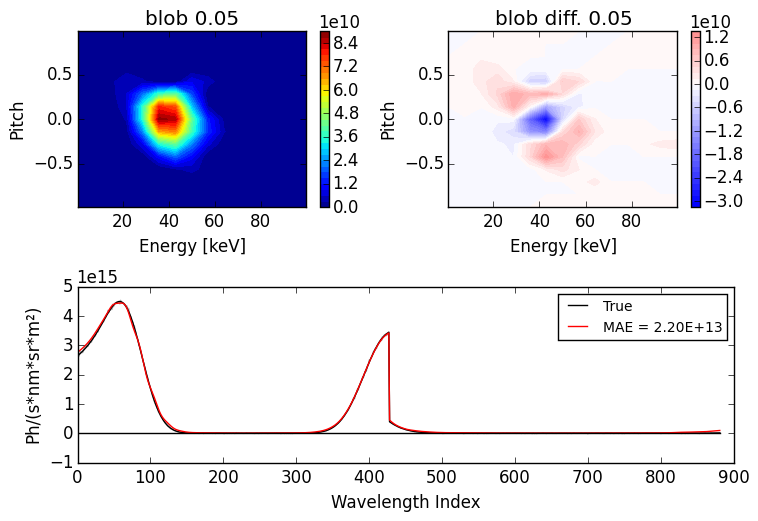

In [25]:
min_fisher_analysis("blob","d3d",elevel=2,doplot=true);

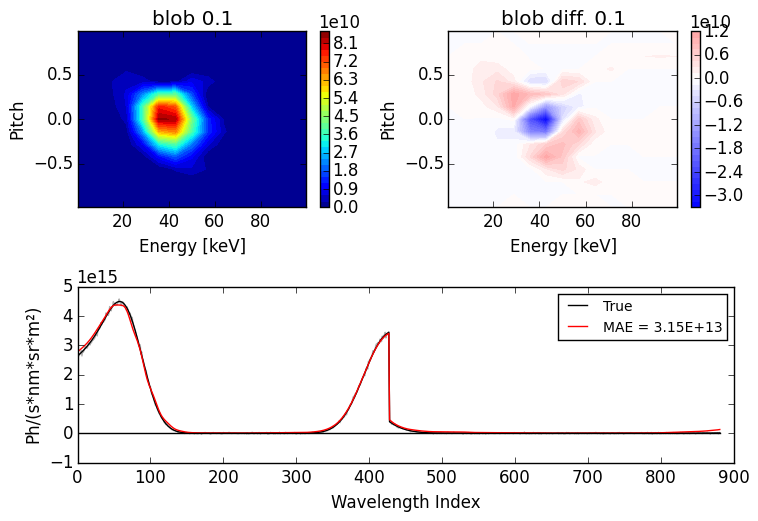

In [26]:
min_fisher_analysis("blob","d3d",elevel=3,doplot=true);

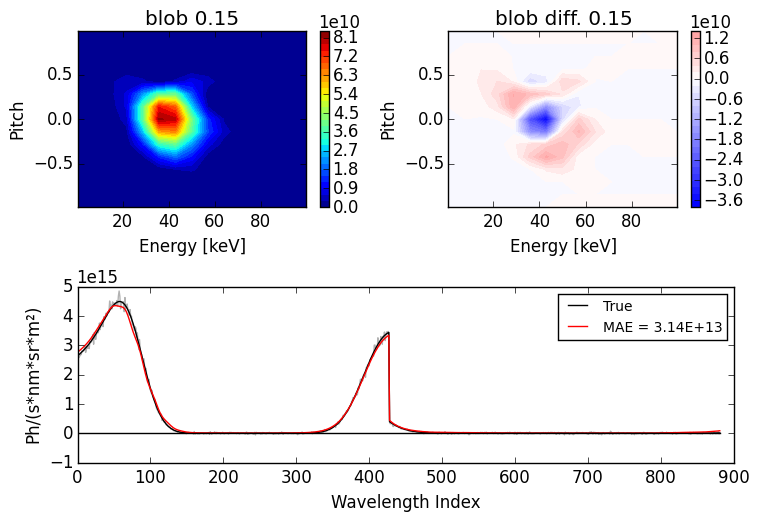

In [27]:
min_fisher_analysis("blob","d3d",elevel=4,doplot=true);

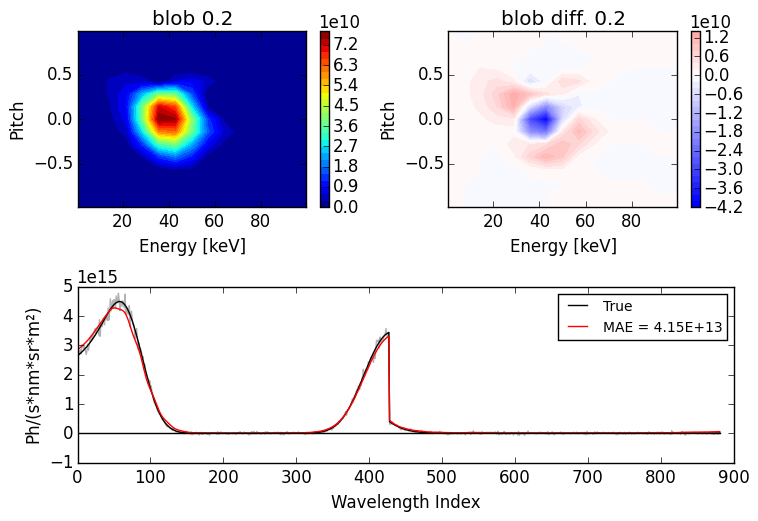

In [28]:
min_fisher_analysis("blob","d3d",elevel=5,doplot=true);

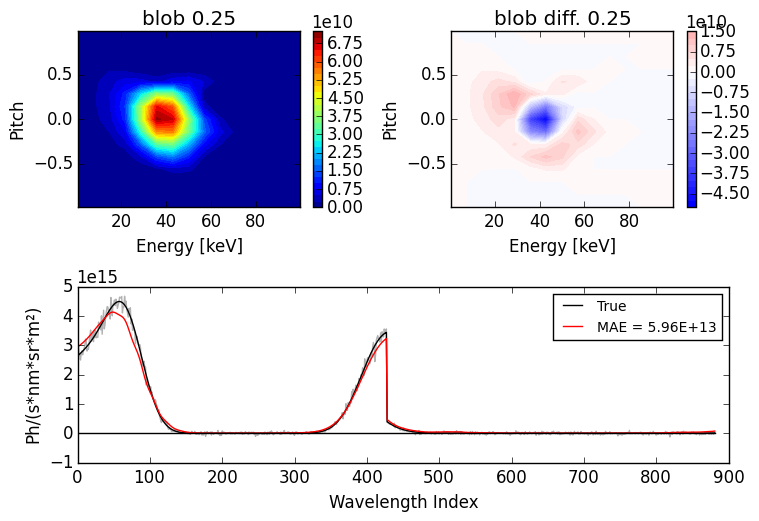

In [29]:
min_fisher_analysis("blob","d3d",elevel=6,doplot=true);

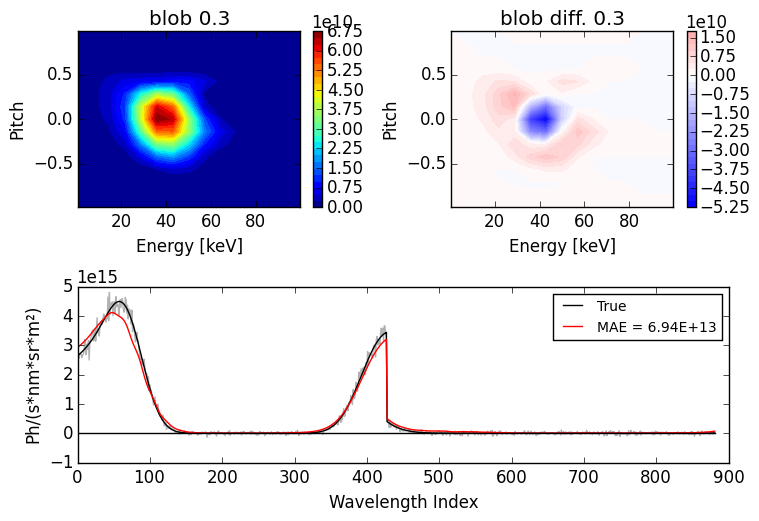

In [30]:
min_fisher_analysis("blob","d3d",elevel=7,doplot=true);

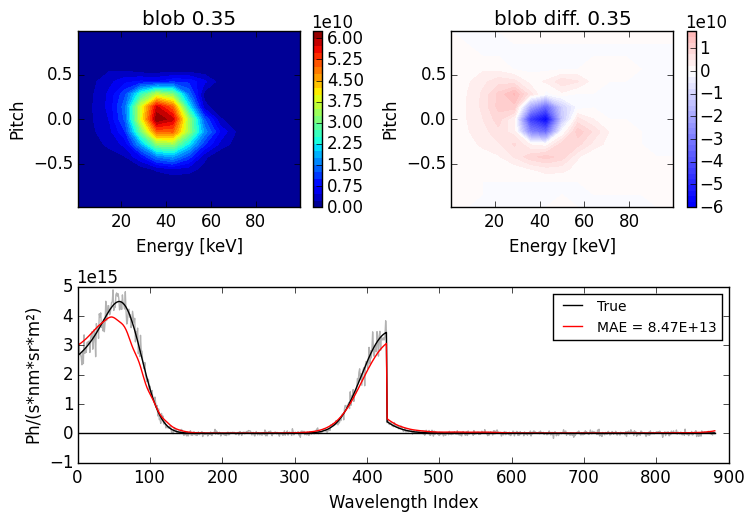

In [31]:
min_fisher_analysis("blob","d3d",elevel=8,doplot=true);

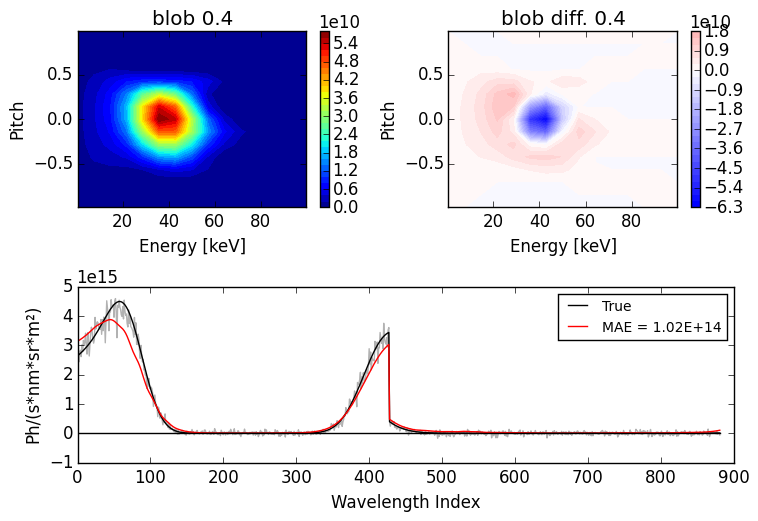

In [32]:
min_fisher_analysis("blob","d3d",elevel=9,doplot=true);

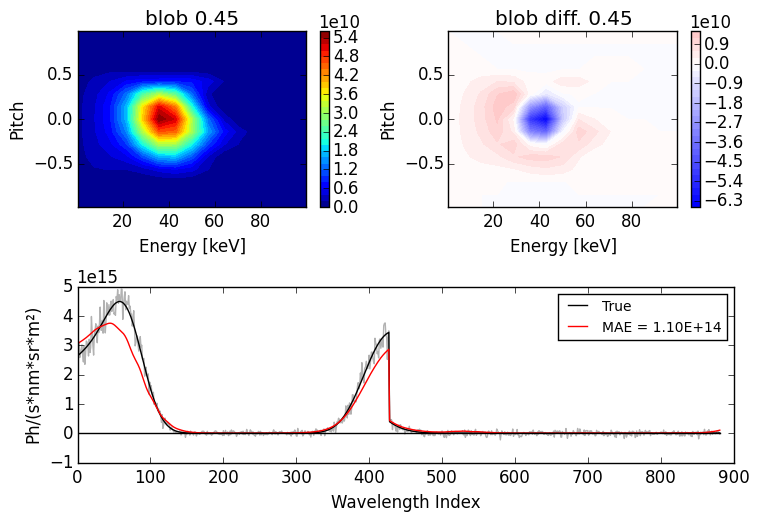

In [33]:
min_fisher_analysis("blob","d3d",elevel=10,doplot=true);

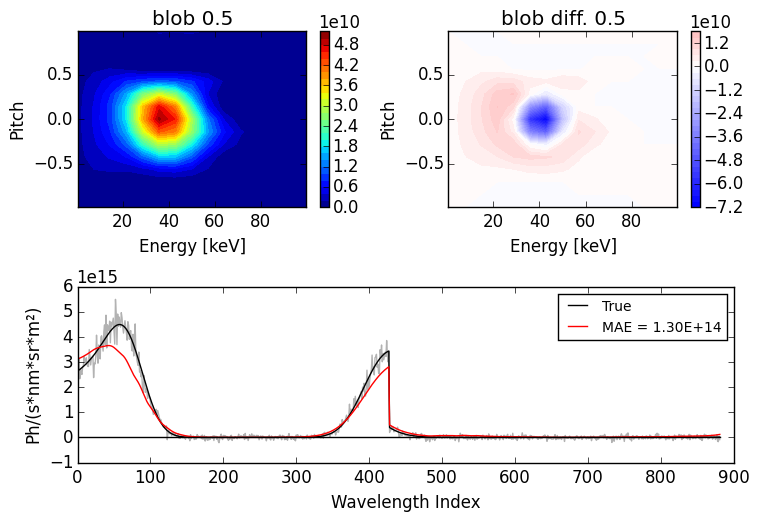

In [34]:
min_fisher_analysis("blob","d3d",elevel=11,doplot=true);

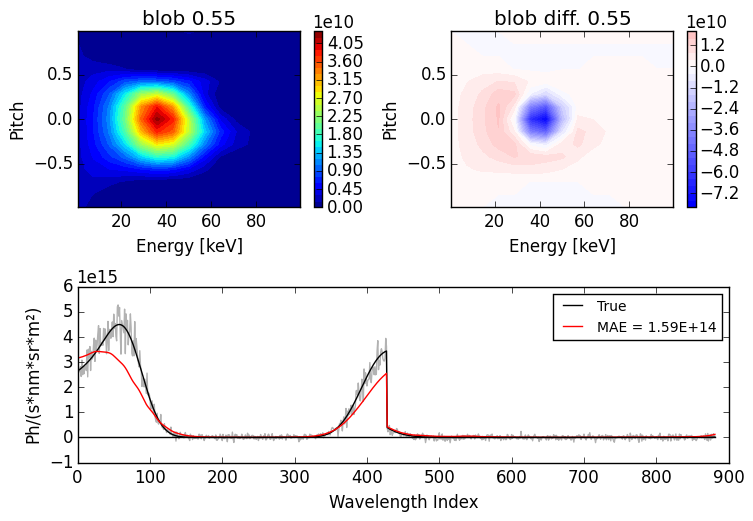

In [35]:
min_fisher_analysis("blob","d3d",elevel=12,doplot=true);

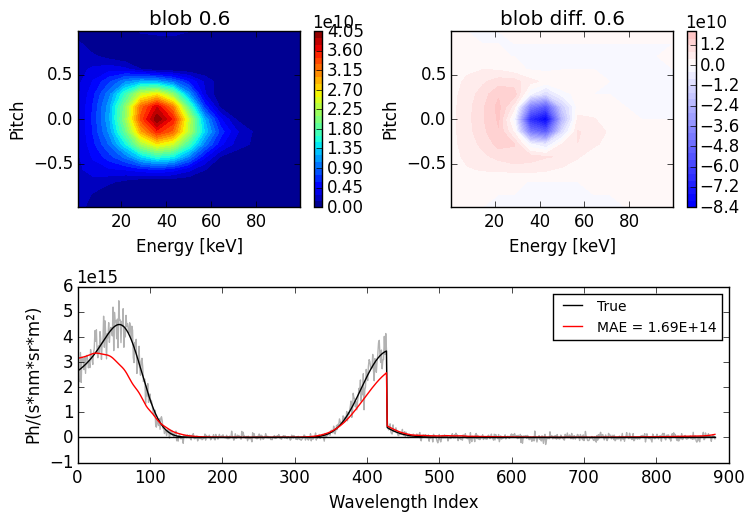

In [36]:
min_fisher_analysis("blob","d3d",elevel=13,doplot=true);

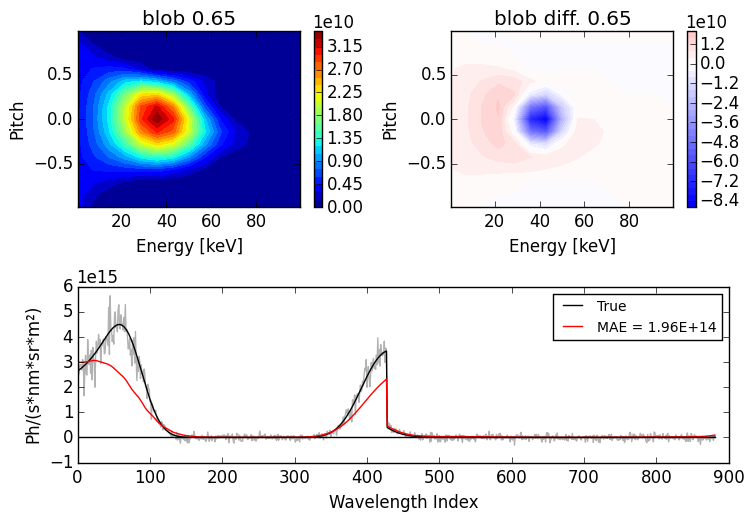

In [37]:
min_fisher_analysis("blob","d3d",elevel=14,doplot=true);

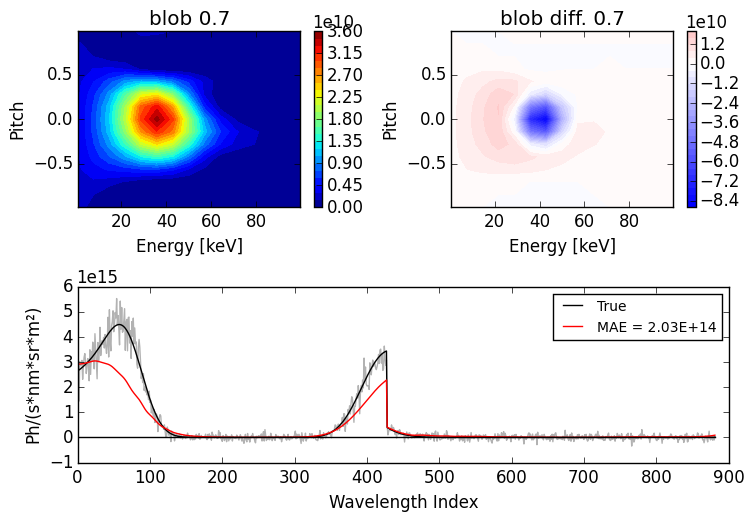

In [38]:
min_fisher_analysis("blob","d3d",elevel=15,doplot=true);

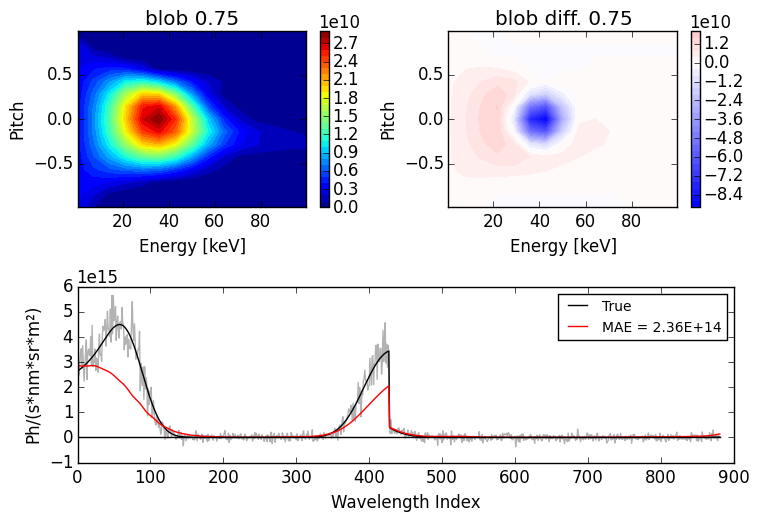

In [39]:
min_fisher_analysis("blob","d3d",elevel=16,doplot=true);

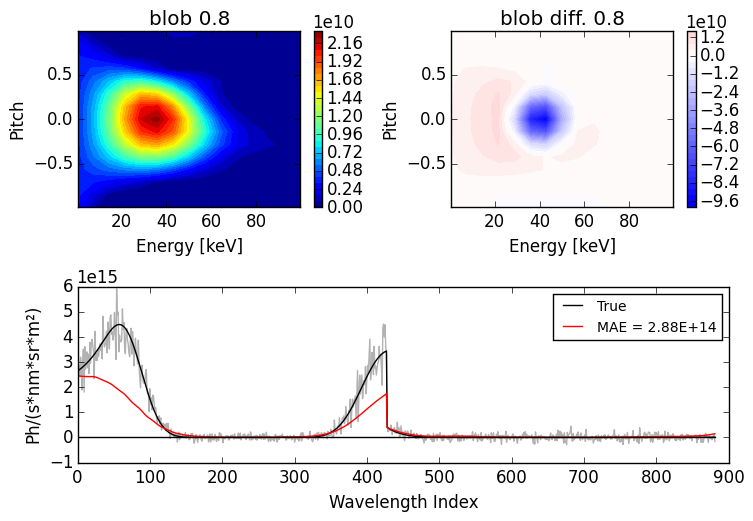

In [40]:
min_fisher_analysis("blob","d3d",elevel=17,doplot=true);

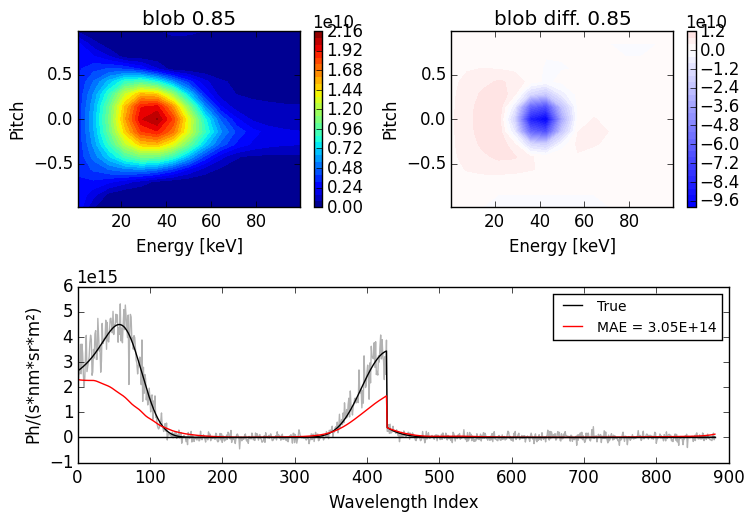

In [41]:
min_fisher_analysis("blob","d3d",elevel=18,doplot=true);

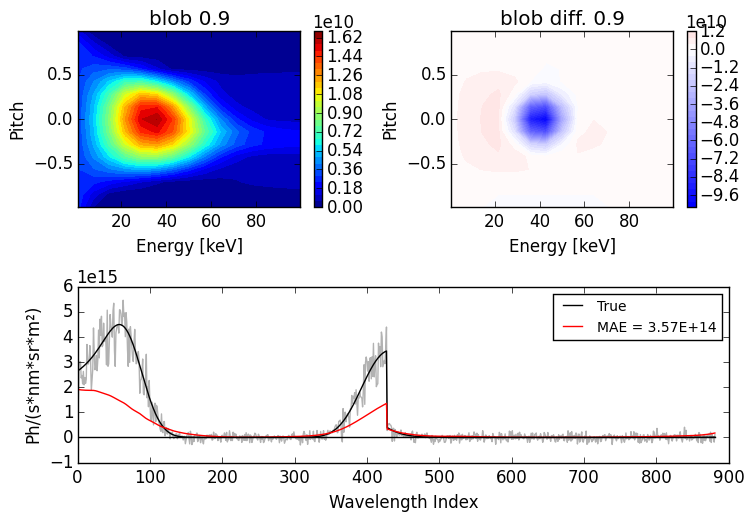

In [42]:
min_fisher_analysis("blob","d3d",elevel=19,doplot=true);

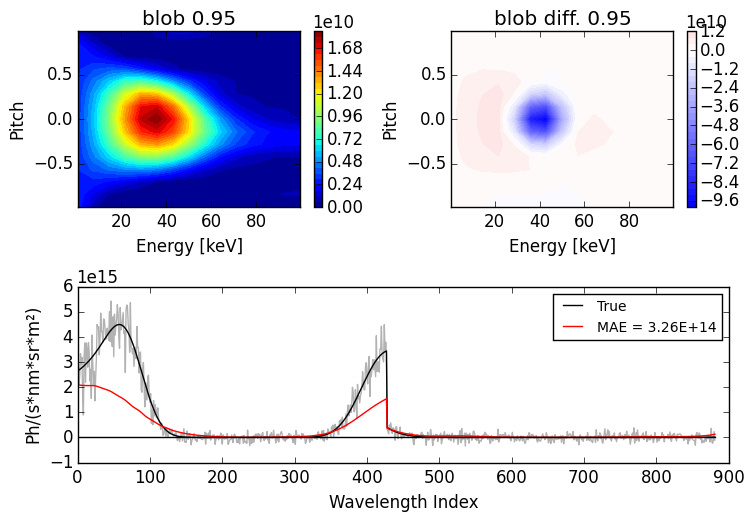

In [43]:
min_fisher_analysis("blob","d3d",elevel=20,doplot=true);

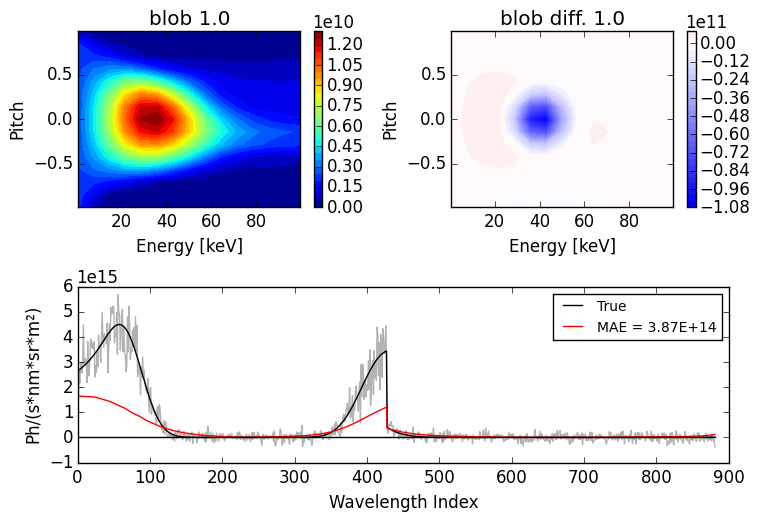

In [44]:
min_fisher_analysis("blob","d3d",elevel=21,doplot=true);

In [45]:
blob_dens = zeros(20);
blob_f = zeros(15*15,20);
blob_diff  = zeros(15*15,20);

In [46]:
for i=2:21
    blob_f[:,i-1],blob_diff[:,i-1],blob_dens[i-1] = min_fisher_analysis("blob","d3d",elevel=i);
end

##6 Blobs Distribution Reconstruction

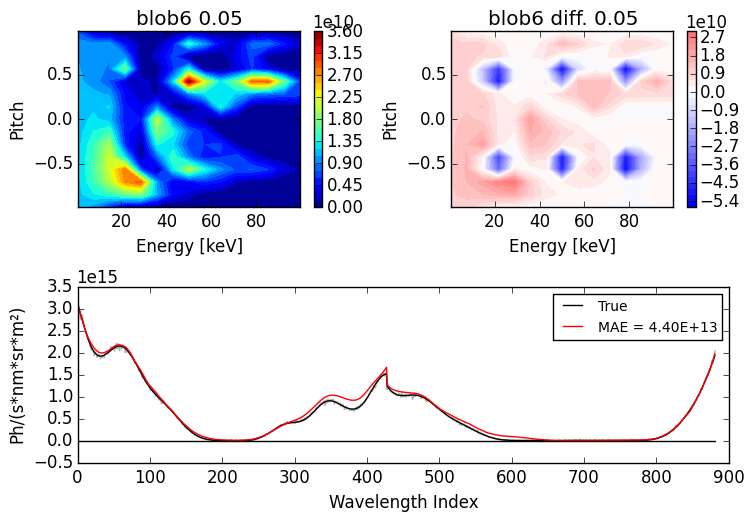

In [47]:
min_fisher_analysis("blob6","d3d",elevel=2,doplot=true);

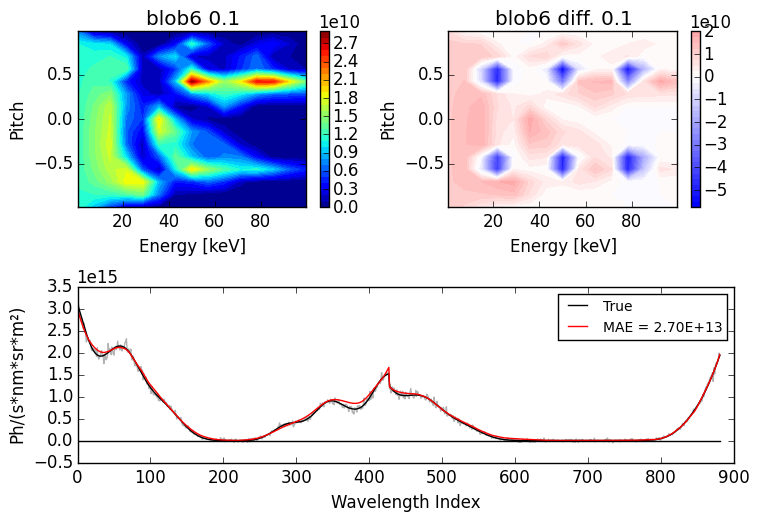

In [48]:
min_fisher_analysis("blob6","d3d",elevel=3,doplot=true);

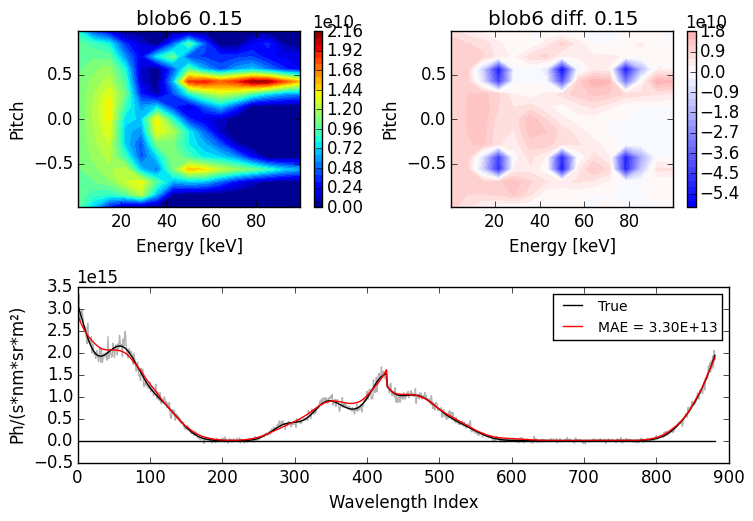

In [49]:
min_fisher_analysis("blob6","d3d",elevel=4,doplot=true);

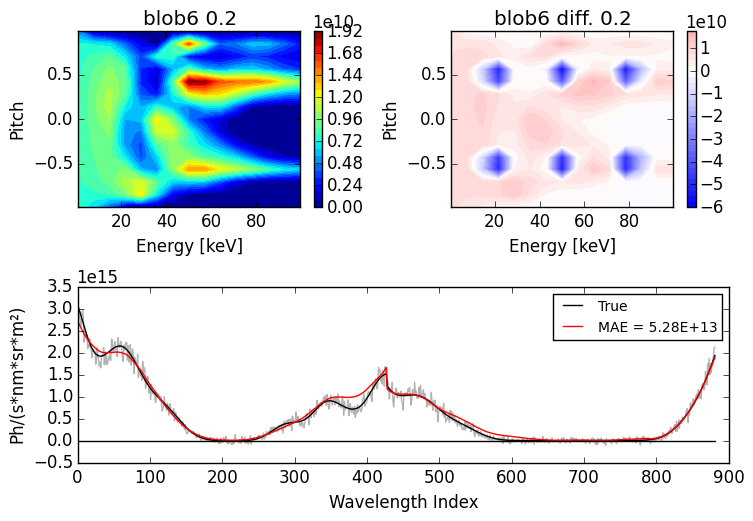

In [50]:
min_fisher_analysis("blob6","d3d",elevel=5,doplot=true);

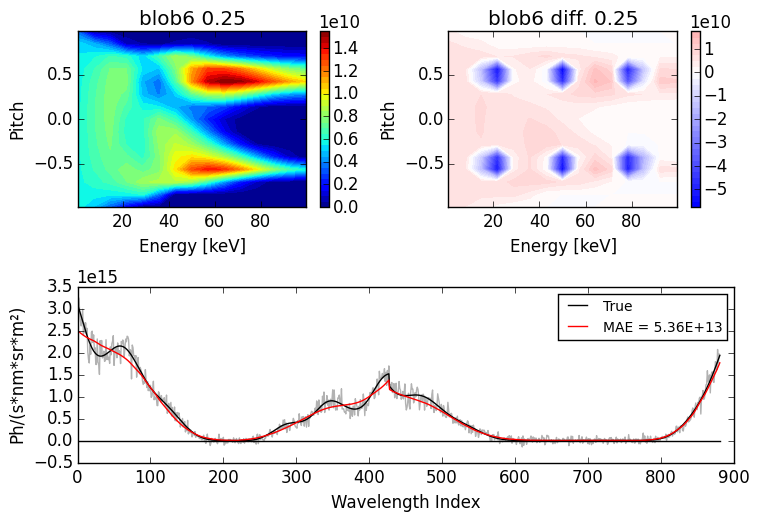

In [51]:
min_fisher_analysis("blob6","d3d",elevel=6,doplot=true);

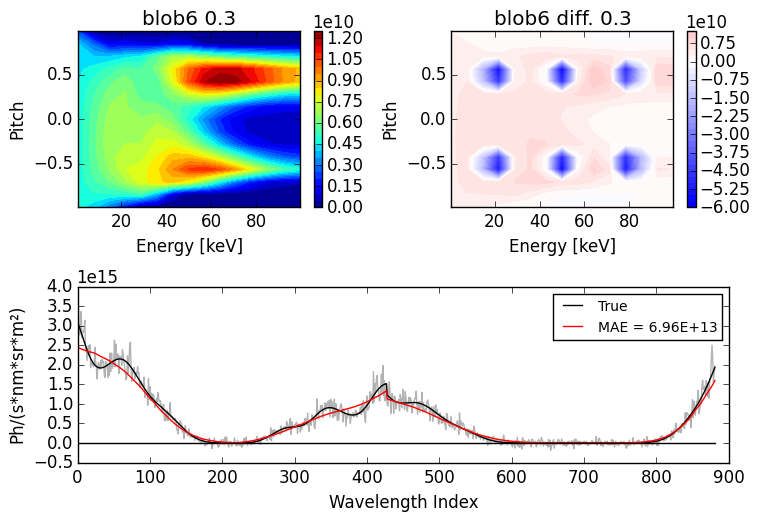

In [52]:
min_fisher_analysis("blob6","d3d",elevel=7,doplot=true);

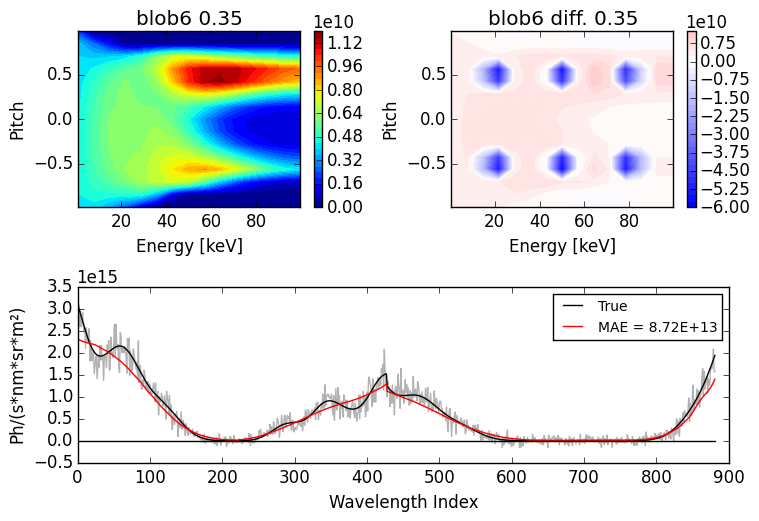

In [53]:
min_fisher_analysis("blob6","d3d",elevel=8,doplot=true);

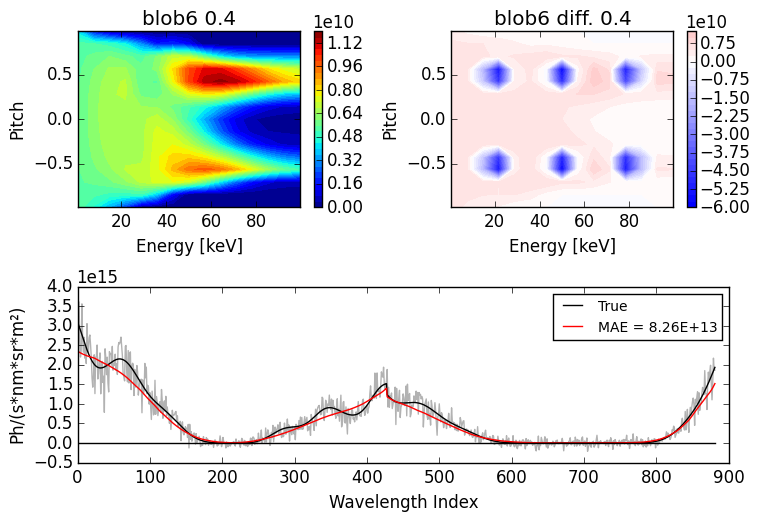

In [54]:
min_fisher_analysis("blob6","d3d",elevel=9,doplot=true);

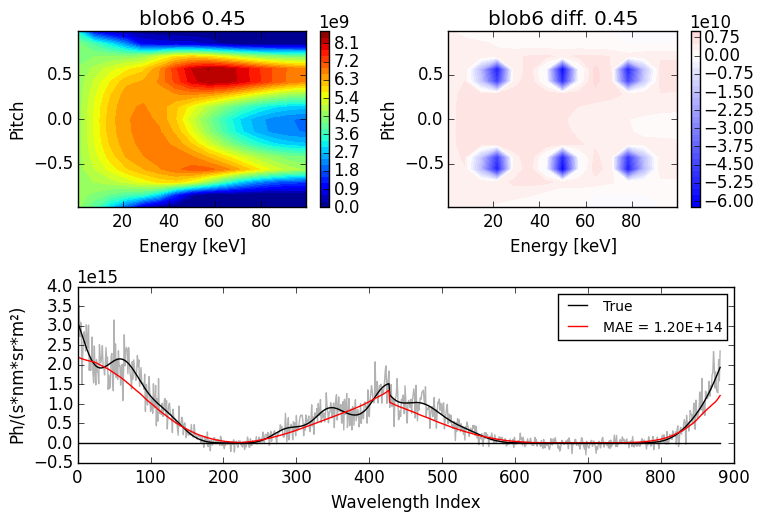

In [55]:
min_fisher_analysis("blob6","d3d",elevel=10,doplot=true);

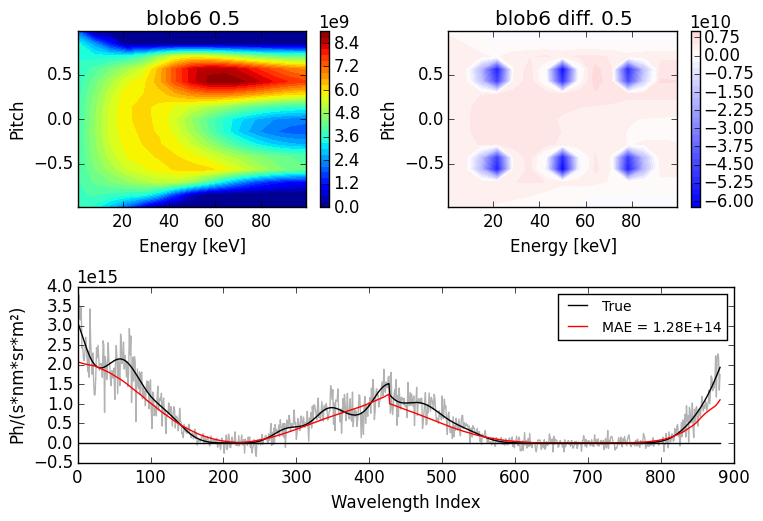

In [56]:
min_fisher_analysis("blob6","d3d",elevel=11,doplot=true);

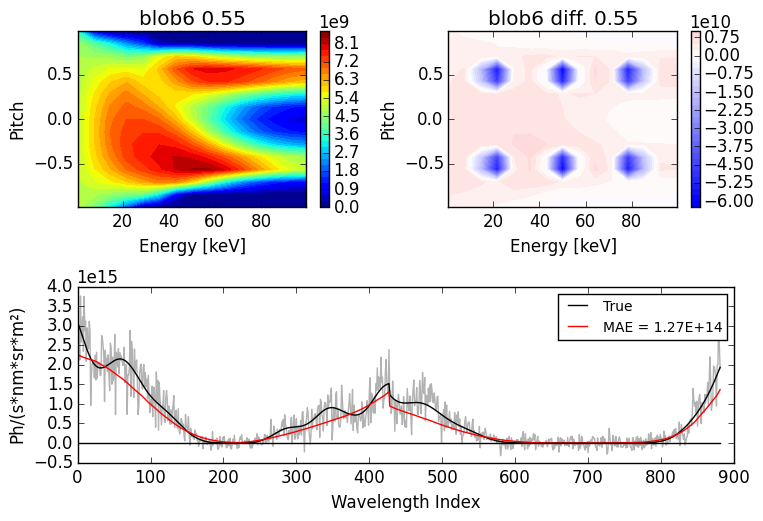

In [57]:
min_fisher_analysis("blob6","d3d",elevel=12,doplot=true);

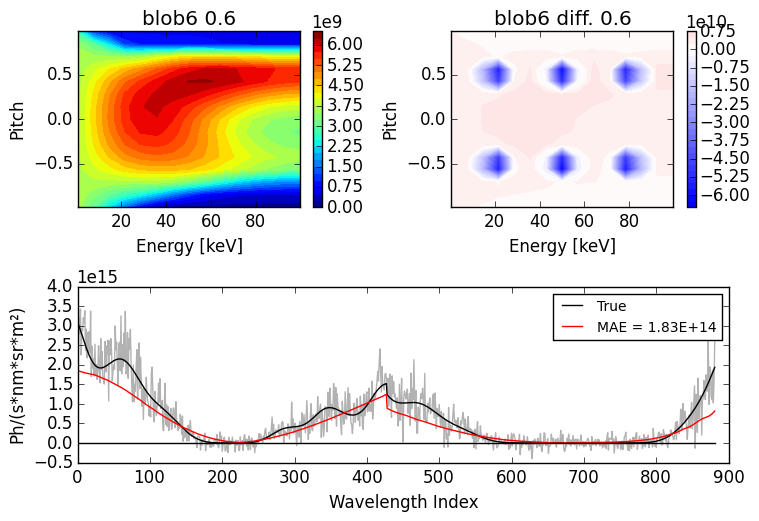

In [58]:
min_fisher_analysis("blob6","d3d",elevel=13,doplot=true);

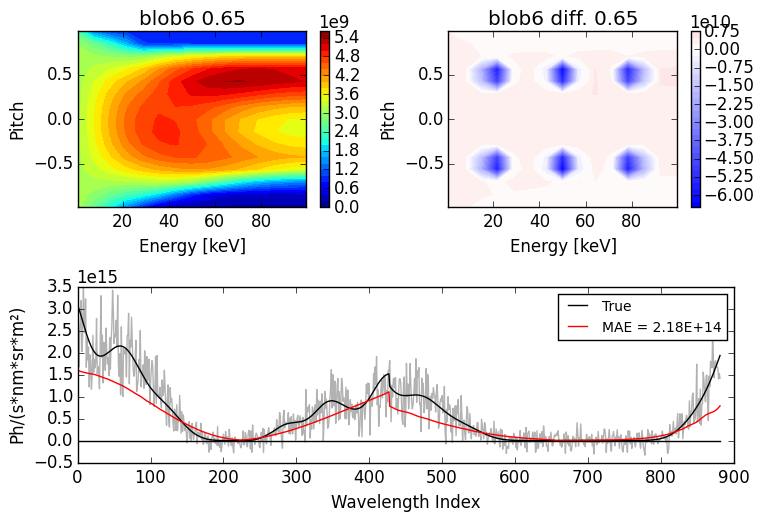

In [59]:
min_fisher_analysis("blob6","d3d",elevel=14,doplot=true);

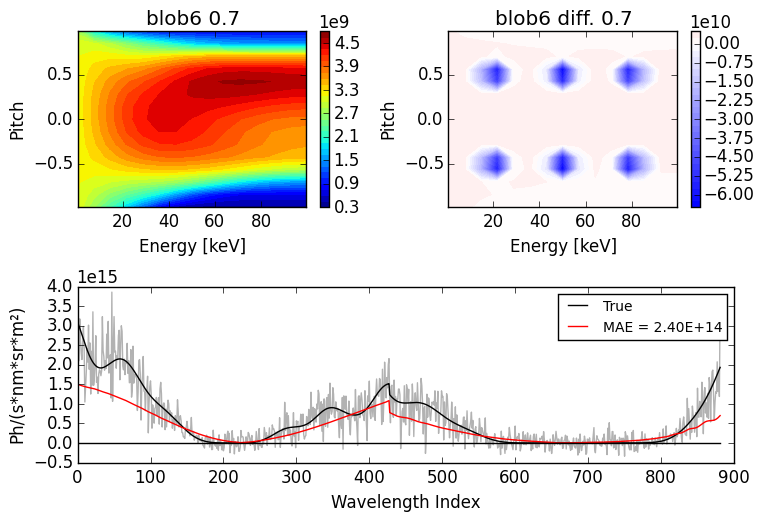

In [60]:
min_fisher_analysis("blob6","d3d",elevel=15,doplot=true);

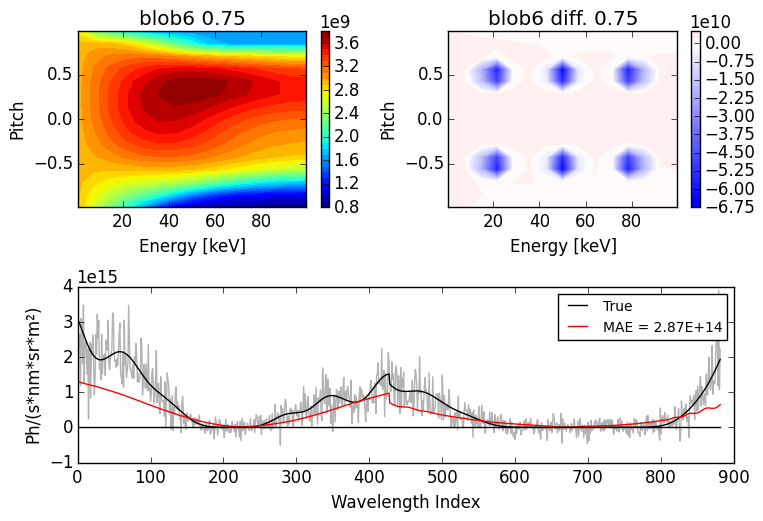

In [61]:
min_fisher_analysis("blob6","d3d",elevel=16,doplot=true);

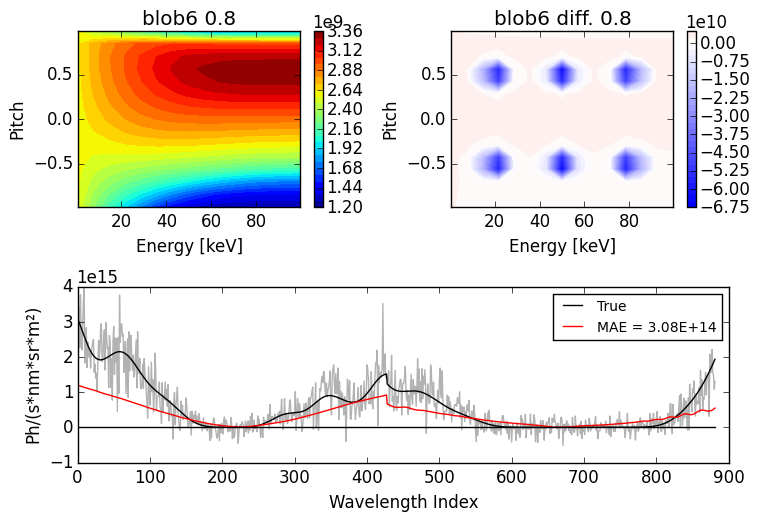

In [62]:
min_fisher_analysis("blob6","d3d",elevel=17,doplot=true);

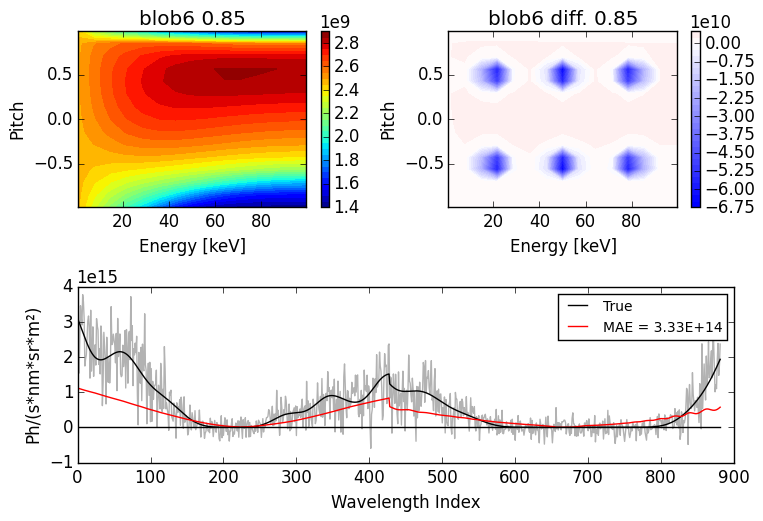

In [63]:
min_fisher_analysis("blob6","d3d",elevel=18,doplot=true);

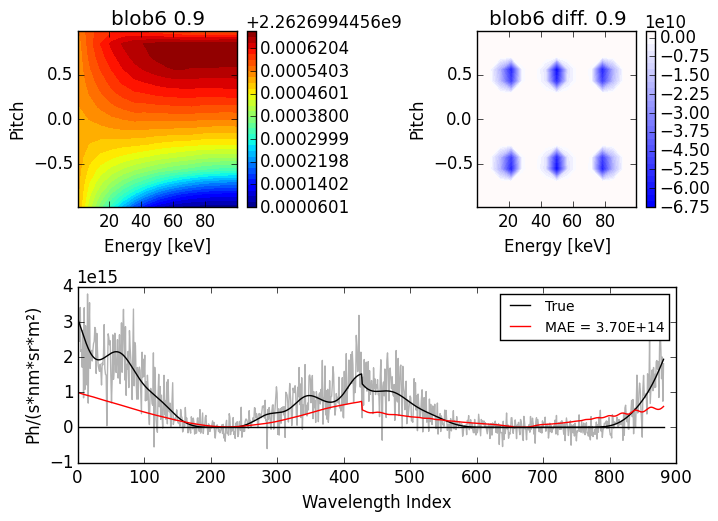

In [64]:
min_fisher_analysis("blob6","d3d",elevel=19,doplot=true);

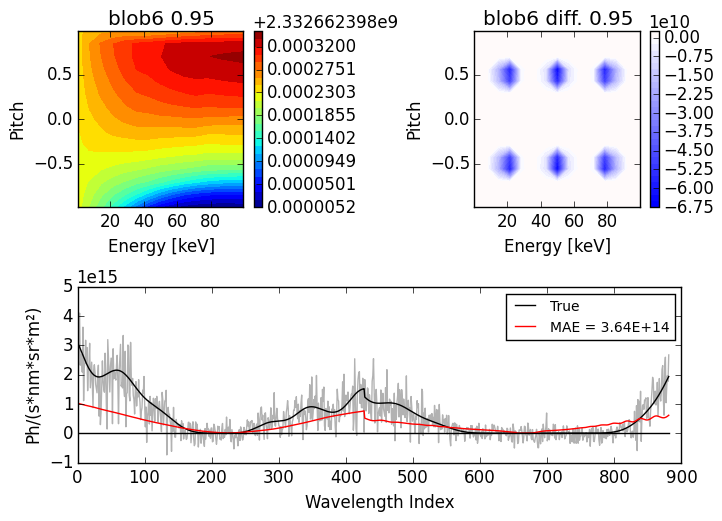

In [65]:
min_fisher_analysis("blob6","d3d",elevel=20,doplot=true);

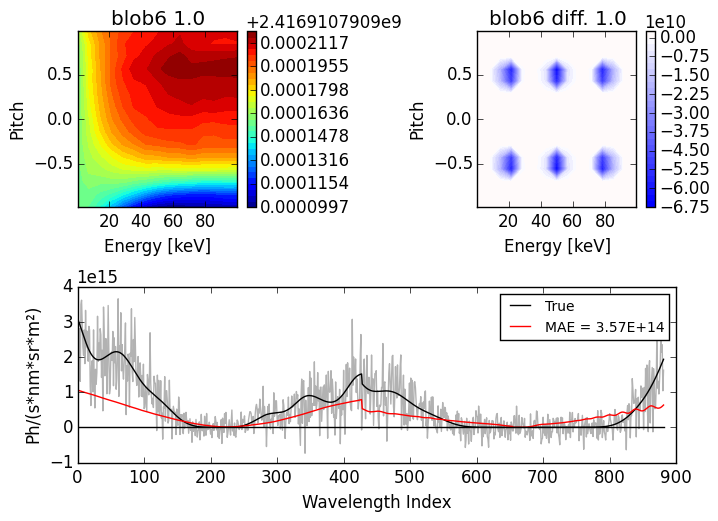

In [66]:
min_fisher_analysis("blob6","d3d",elevel=21,doplot=true);

In [67]:
blob6_dens = zeros(20);
blob6_f = zeros(15*15,20);
blob6_diff  = zeros(15*15,20);

In [68]:
for i=2:21
    blob6_f[:,i-1],blob6_diff[:,i-1],blob6_dens[i-1] = min_fisher_analysis("blob6","d3d",elevel=i);
end

##Bimaxwellian Distribution Reconstruction

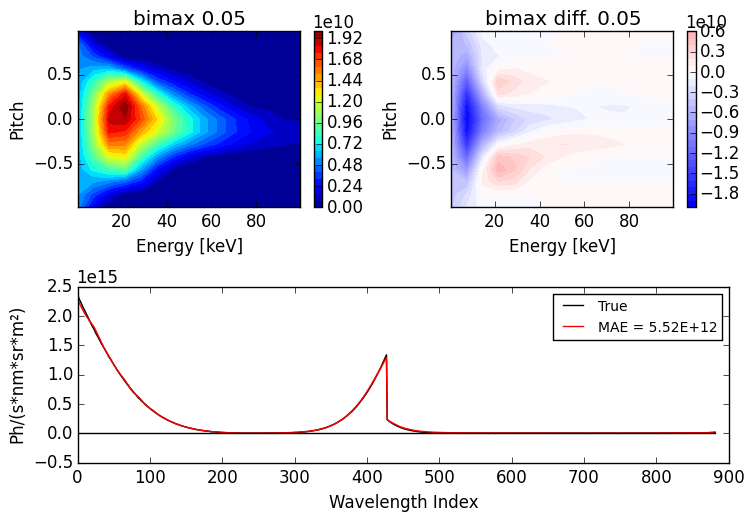

In [69]:
min_fisher_analysis("bimax","d3d",elevel=2,doplot=true);

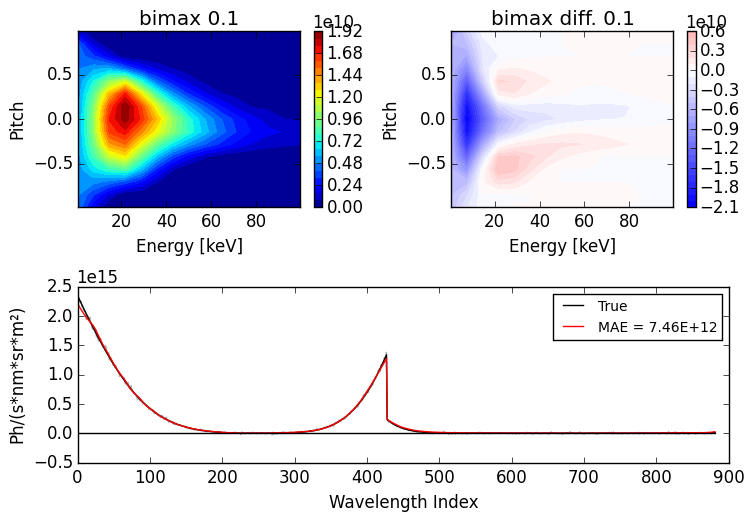

In [70]:
min_fisher_analysis("bimax","d3d",elevel=3,doplot=true);

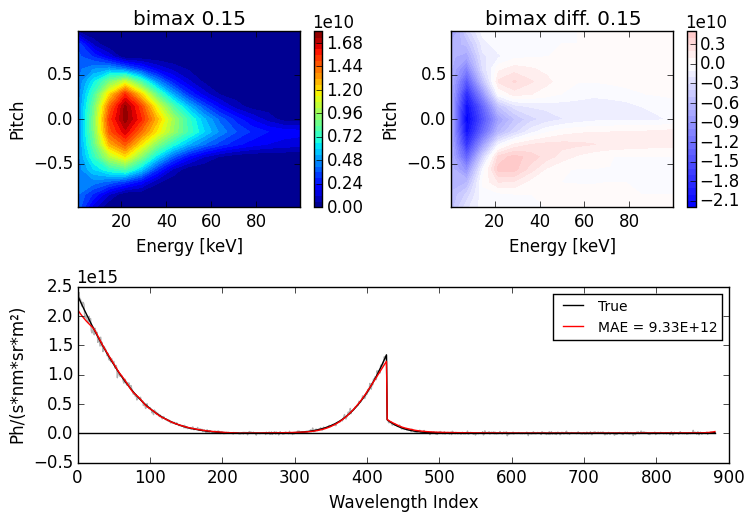

In [71]:
min_fisher_analysis("bimax","d3d",elevel=4,doplot=true);

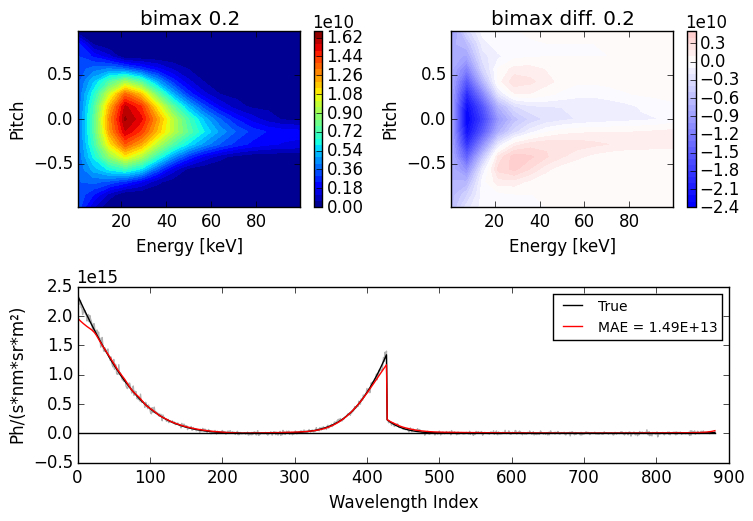

In [72]:
min_fisher_analysis("bimax","d3d",elevel=5,doplot=true);

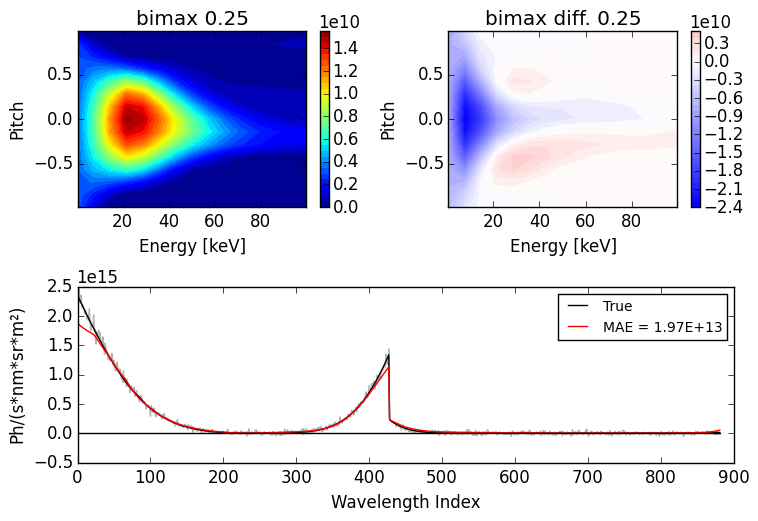

In [73]:
min_fisher_analysis("bimax","d3d",elevel=6,doplot=true);

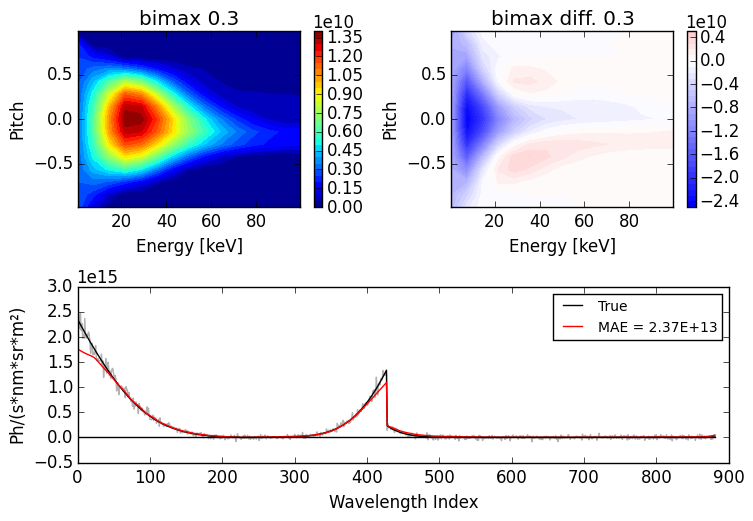

In [74]:
min_fisher_analysis("bimax","d3d",elevel=7,doplot=true);

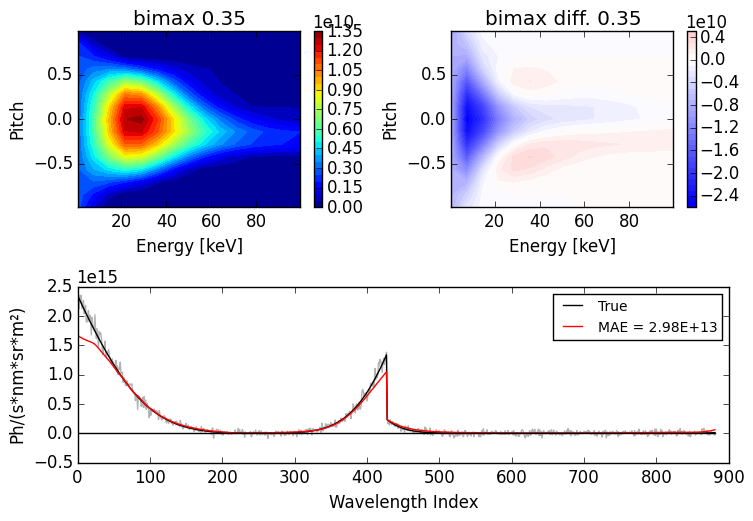

In [75]:
min_fisher_analysis("bimax","d3d",elevel=8,doplot=true);

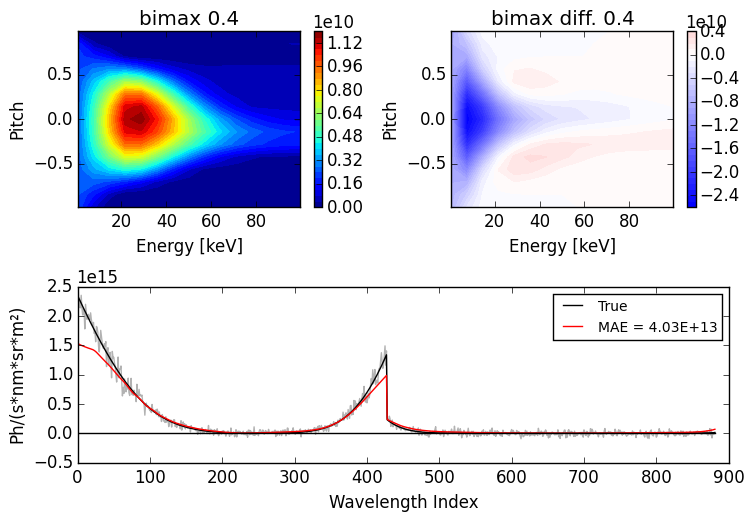

In [76]:
min_fisher_analysis("bimax","d3d",elevel=9,doplot=true);

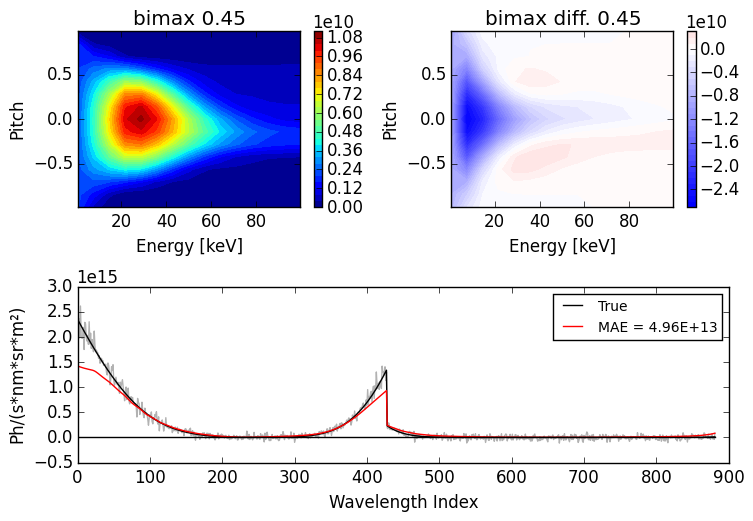

In [77]:
min_fisher_analysis("bimax","d3d",elevel=10,doplot=true);

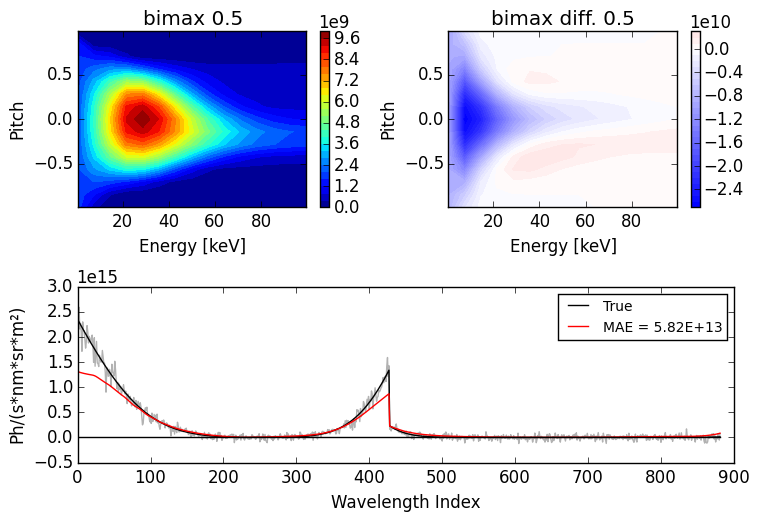

In [78]:
min_fisher_analysis("bimax","d3d",elevel=11,doplot=true);

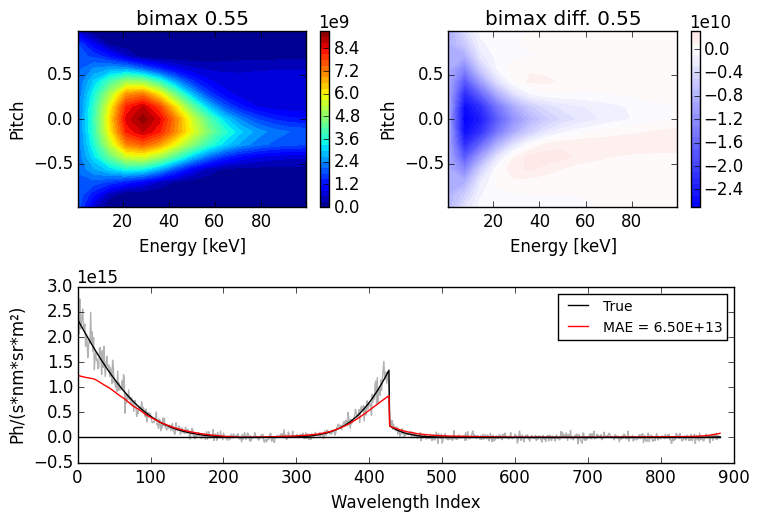

In [79]:
min_fisher_analysis("bimax","d3d",elevel=12,doplot=true);

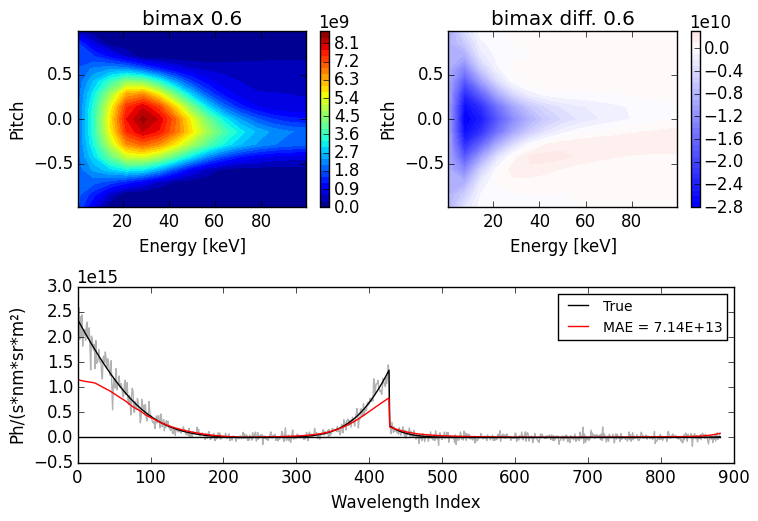

In [80]:
min_fisher_analysis("bimax","d3d",elevel=13,doplot=true);

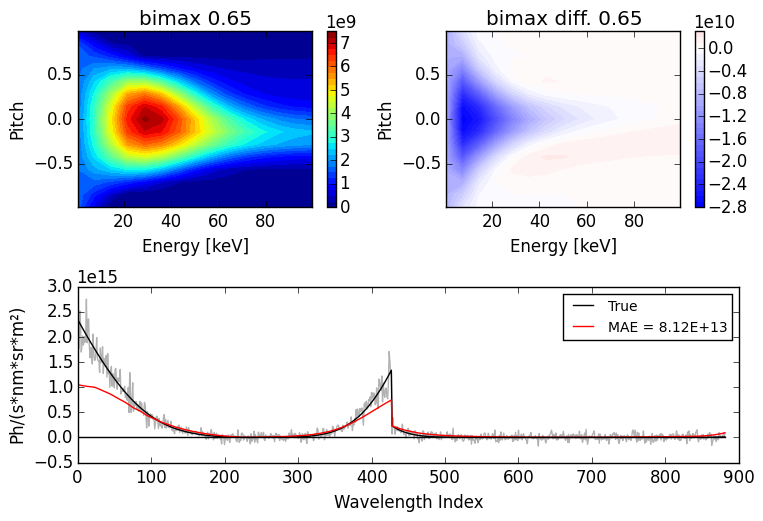

In [81]:
min_fisher_analysis("bimax","d3d",elevel=14,doplot=true);

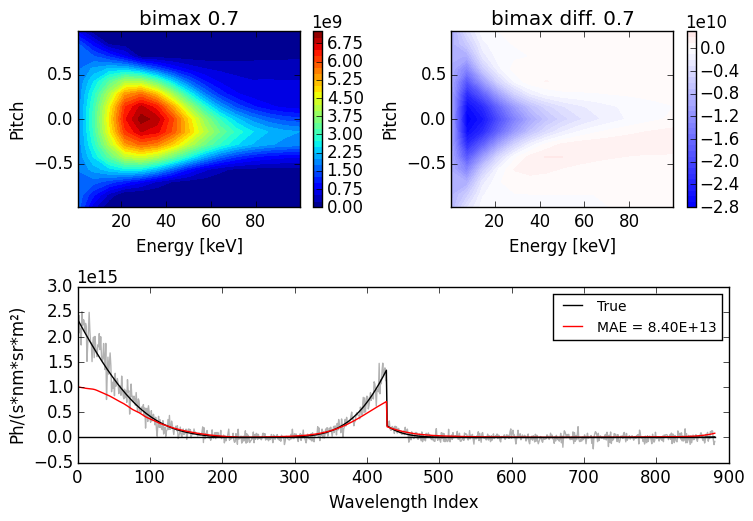

In [82]:
min_fisher_analysis("bimax","d3d",elevel=15,doplot=true);

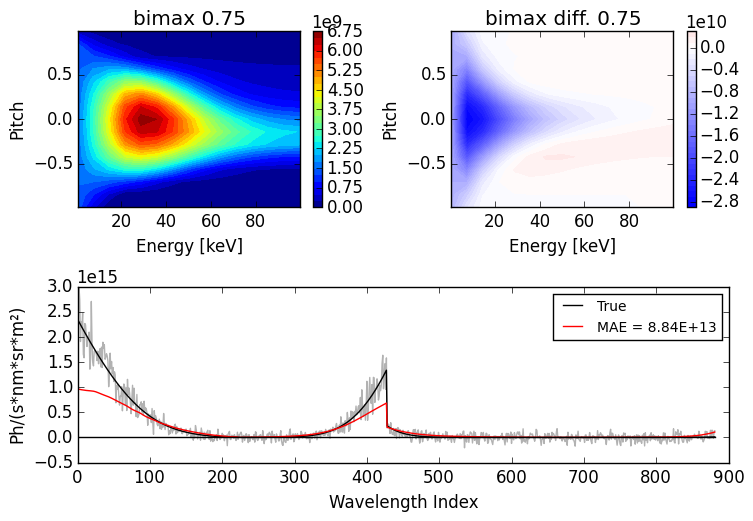

In [83]:
min_fisher_analysis("bimax","d3d",elevel=16,doplot=true);

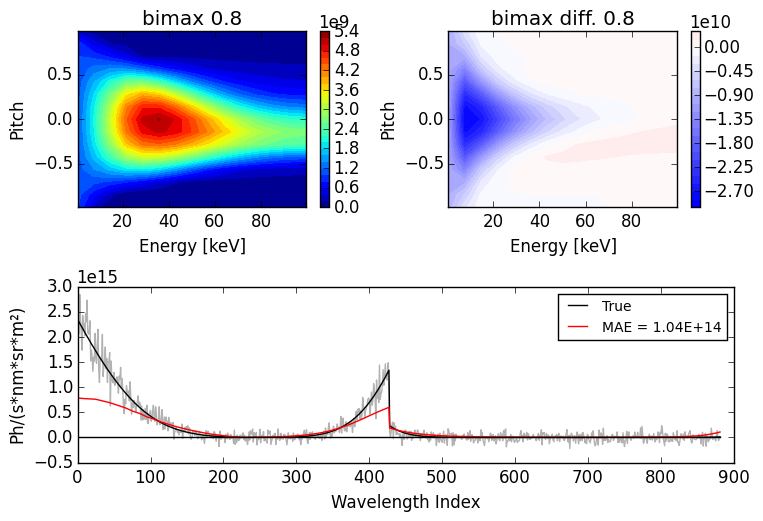

In [84]:
min_fisher_analysis("bimax","d3d",elevel=17,doplot=true);

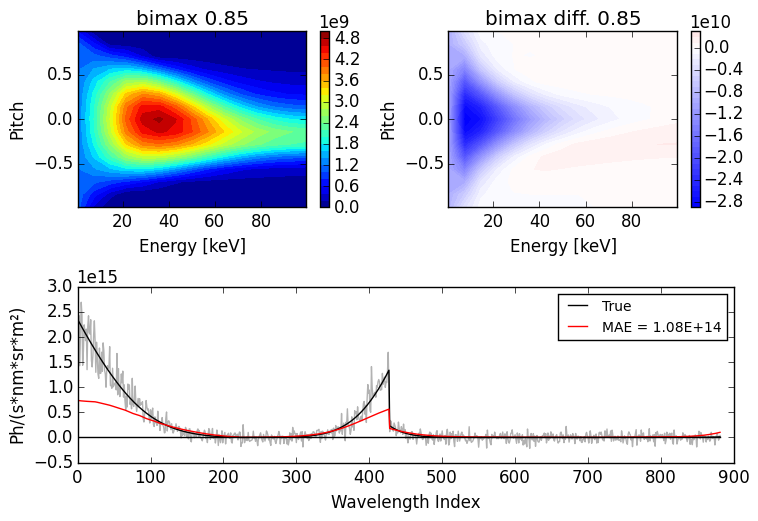

In [85]:
min_fisher_analysis("bimax","d3d",elevel=18,doplot=true);

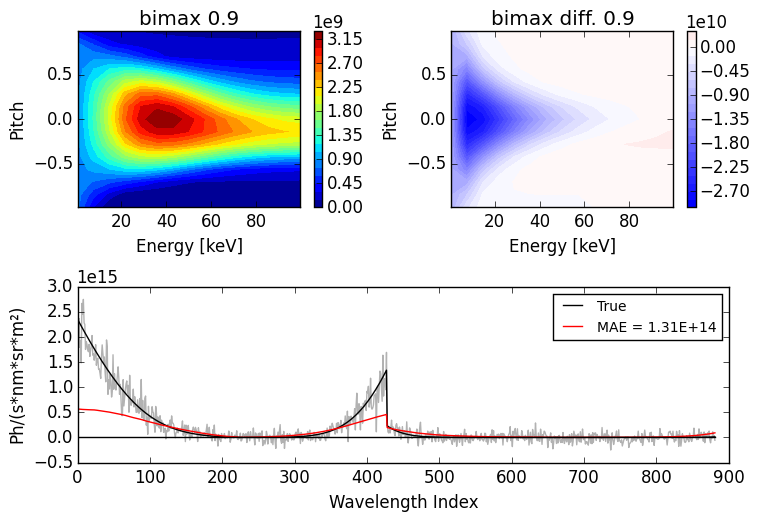

In [86]:
min_fisher_analysis("bimax","d3d",elevel=19,doplot=true);

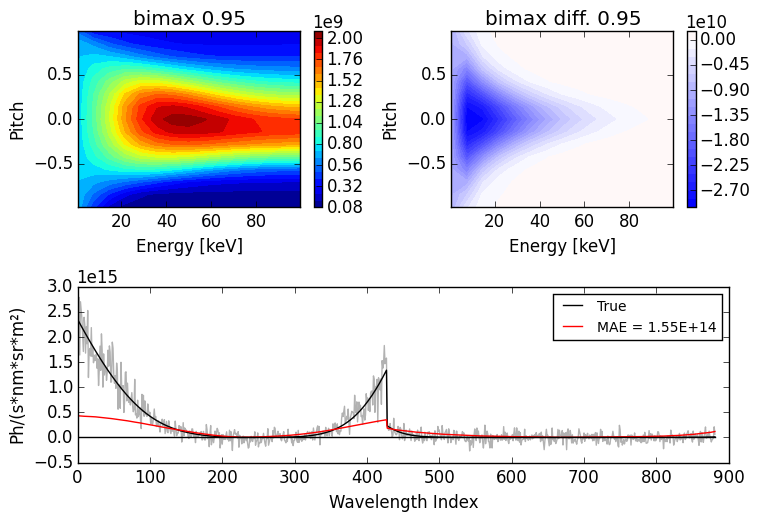

In [87]:
min_fisher_analysis("bimax","d3d",elevel=20,doplot=true);

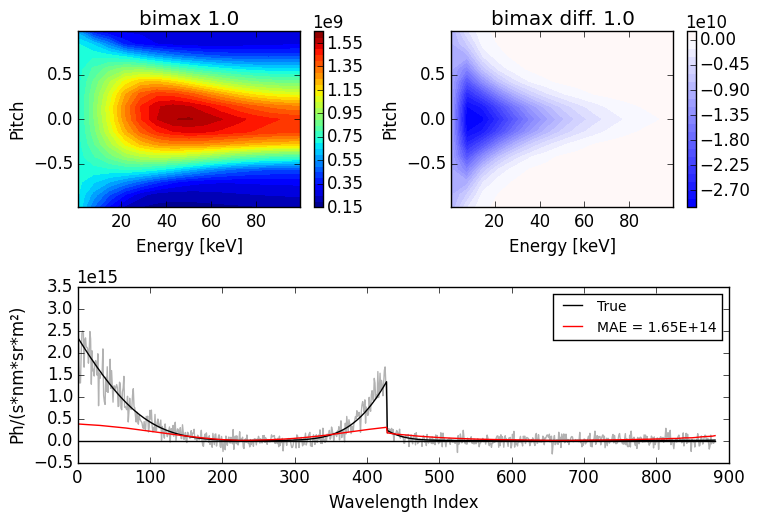

In [88]:
min_fisher_analysis("bimax","d3d",elevel=21,doplot=true);

In [89]:
bimax_dens = zeros(20);
bimax_f = zeros(15*15,20);
bimax_diff  = zeros(15*15,20);

In [90]:
for i=2:21
    bimax_f[:,i-1],bimax_diff[:,i-1],bimax_dens[i-1] = min_fisher_analysis("bimax","d3d",elevel=i);
end

##TRANSP Distribution Reconstruction

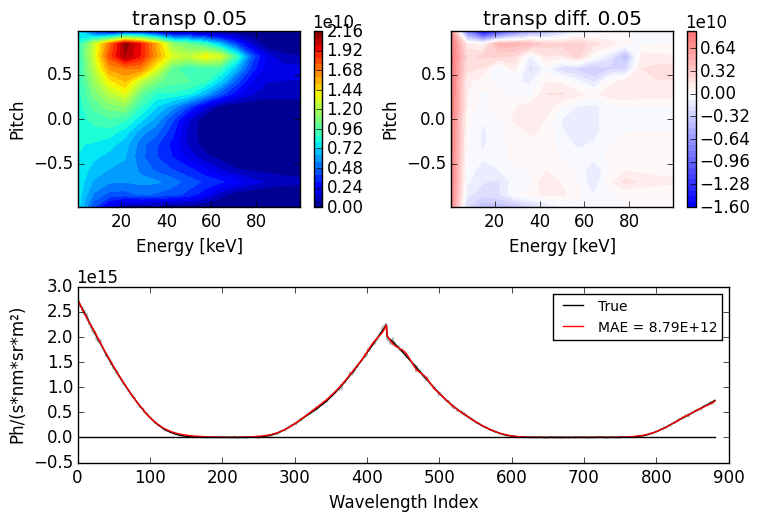

In [91]:
min_fisher_analysis("transp","d3d",elevel=2,doplot=true);

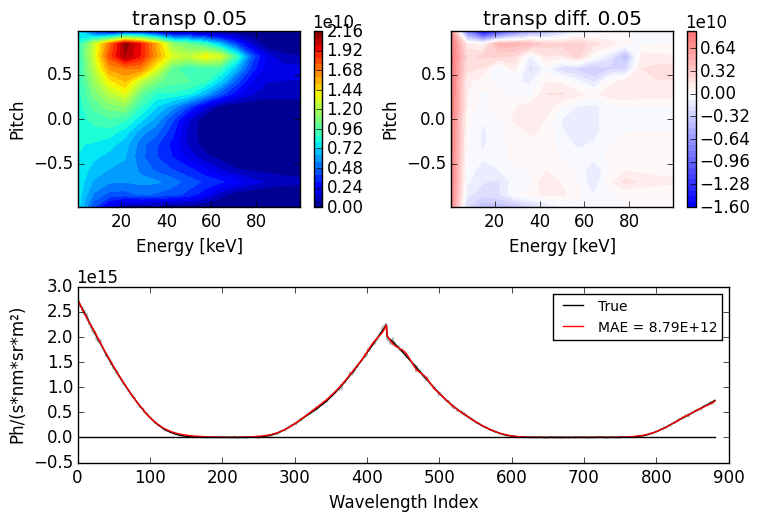

In [92]:
min_fisher_analysis("transp","d3d",elevel=2,doplot=true);

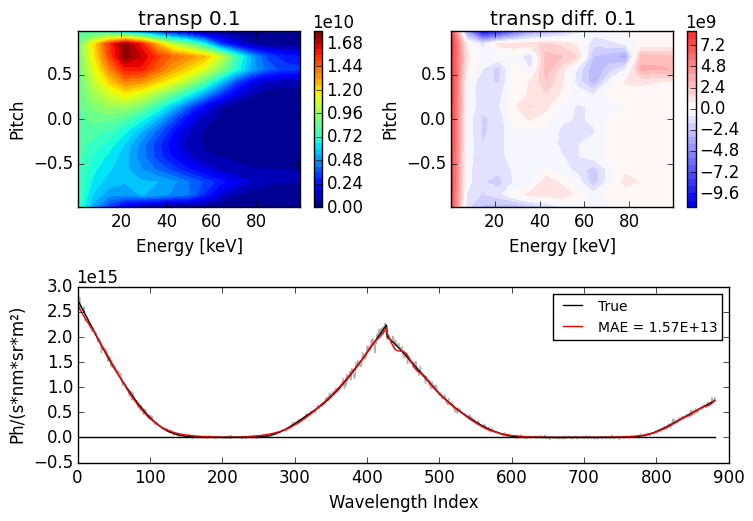

In [93]:
min_fisher_analysis("transp","d3d",elevel=3,doplot=true);

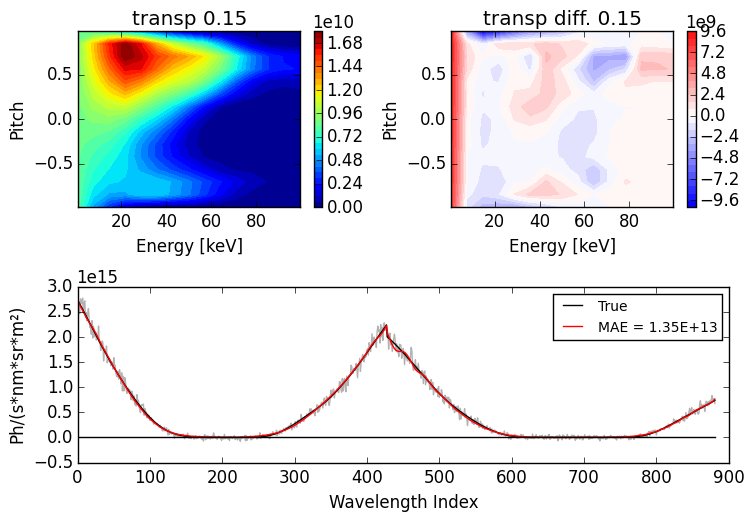

In [94]:
min_fisher_analysis("transp","d3d",elevel=4,doplot=true);

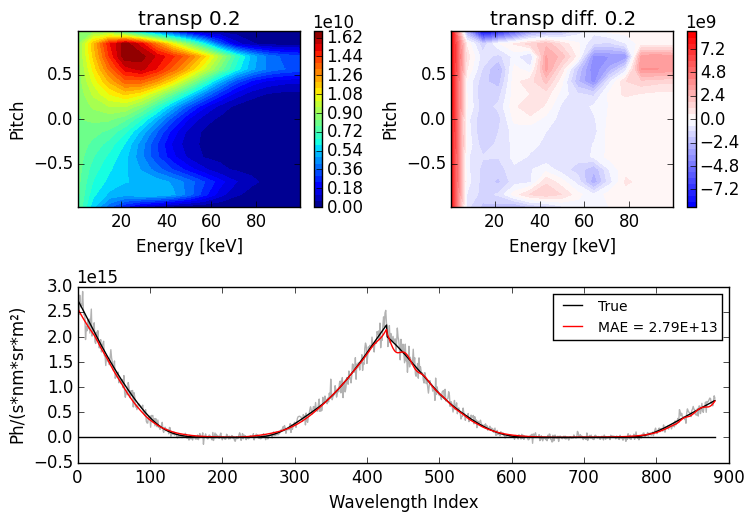

In [95]:
min_fisher_analysis("transp","d3d",elevel=5,doplot=true);

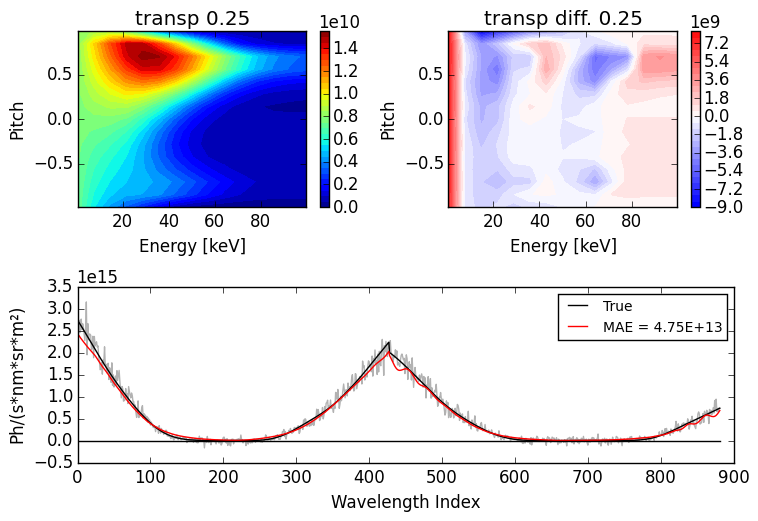

In [96]:
min_fisher_analysis("transp","d3d",elevel=6,doplot=true);

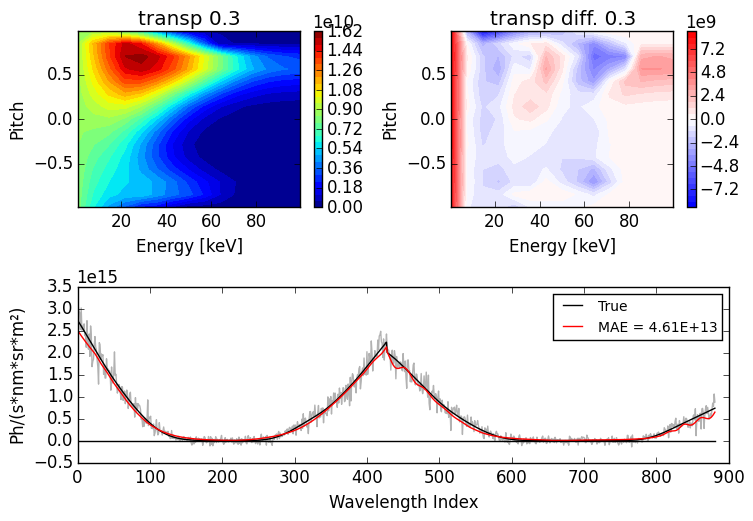

In [97]:
min_fisher_analysis("transp","d3d",elevel=7,doplot=true);

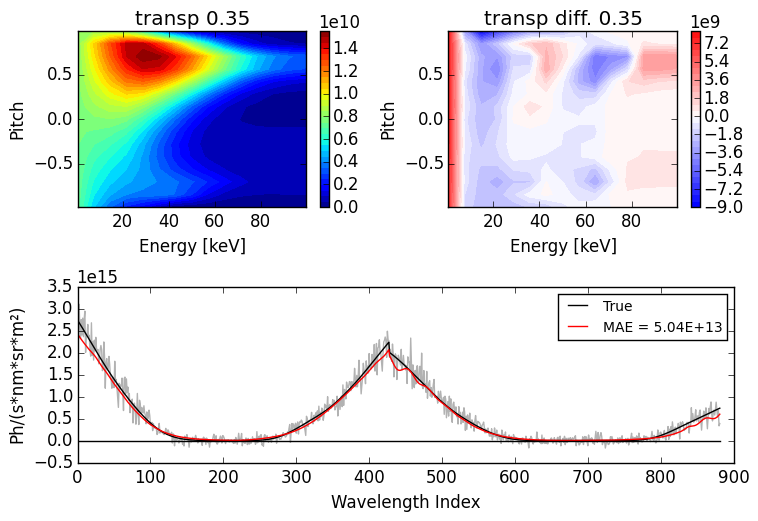

In [98]:
min_fisher_analysis("transp","d3d",elevel=8,doplot=true);

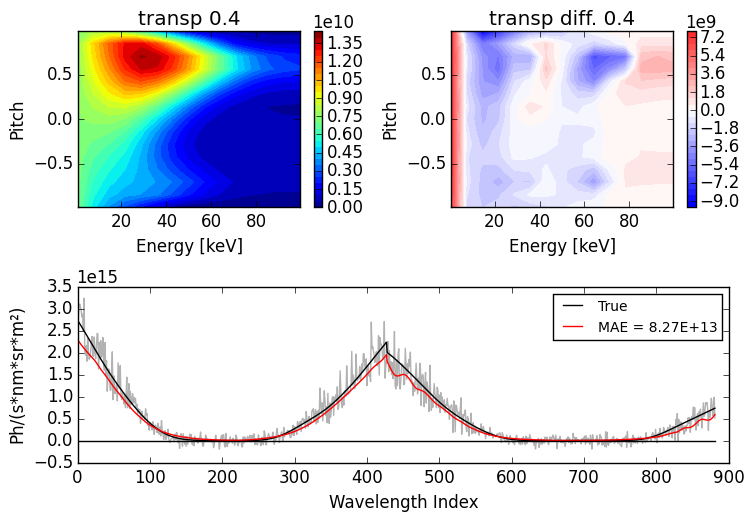

In [99]:
min_fisher_analysis("transp","d3d",elevel=9,doplot=true);

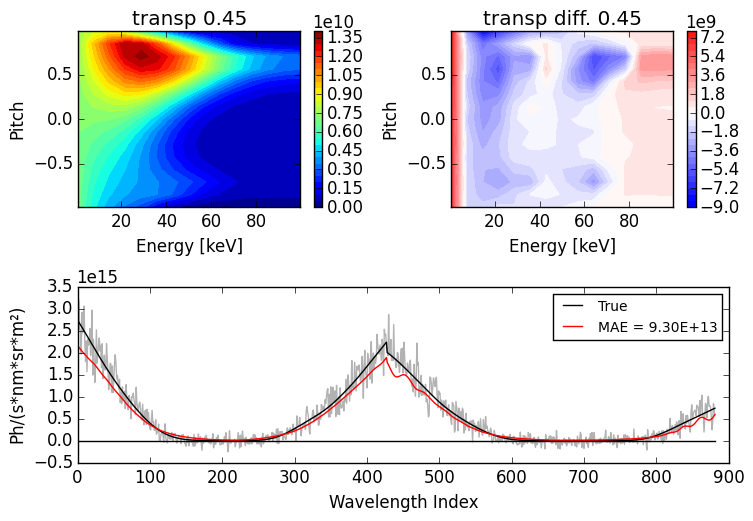

In [100]:
min_fisher_analysis("transp","d3d",elevel=10,doplot=true);

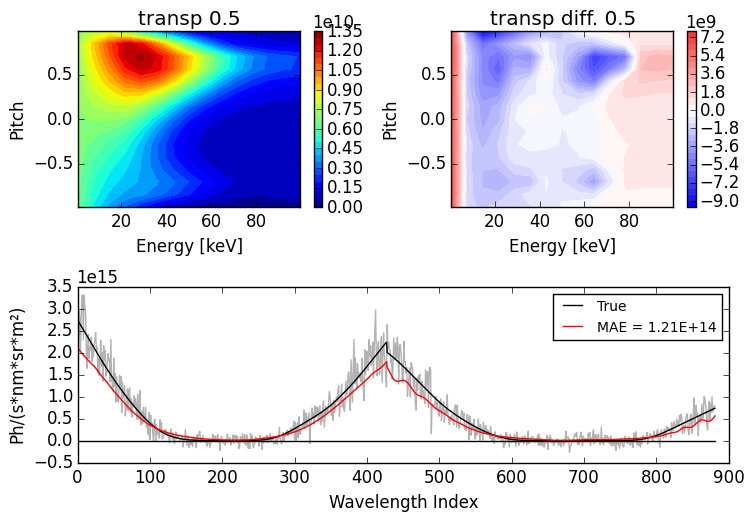

In [101]:
min_fisher_analysis("transp","d3d",elevel=11,doplot=true);

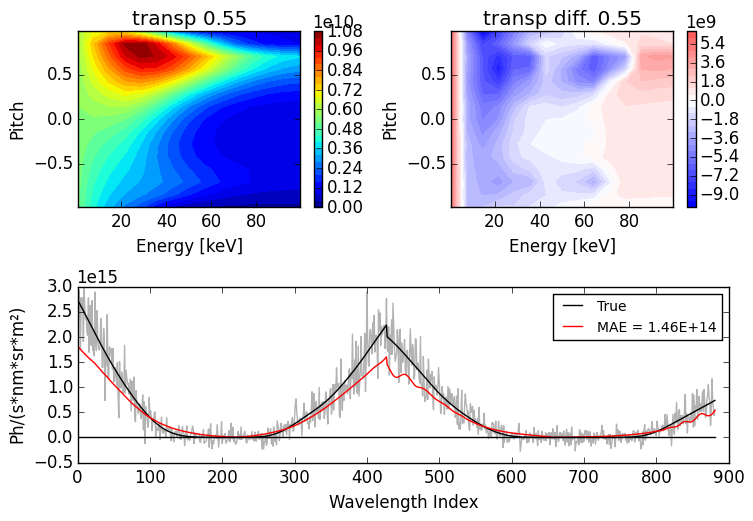

In [102]:
min_fisher_analysis("transp","d3d",elevel=12,doplot=true);

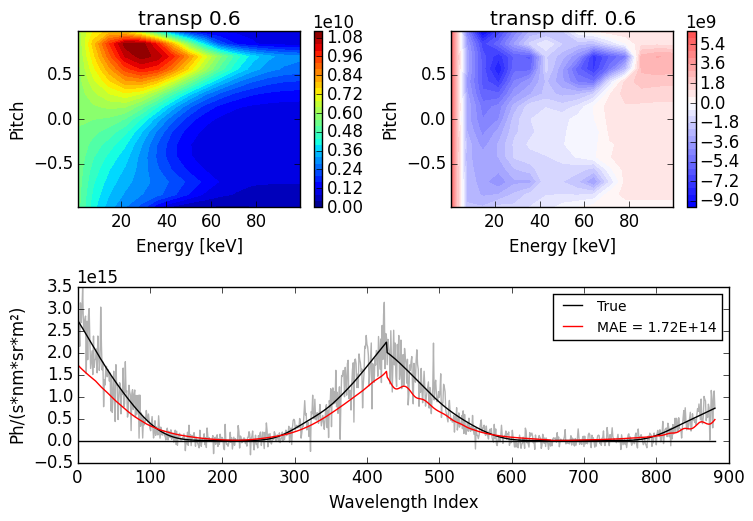

In [103]:
min_fisher_analysis("transp","d3d",elevel=13,doplot=true);

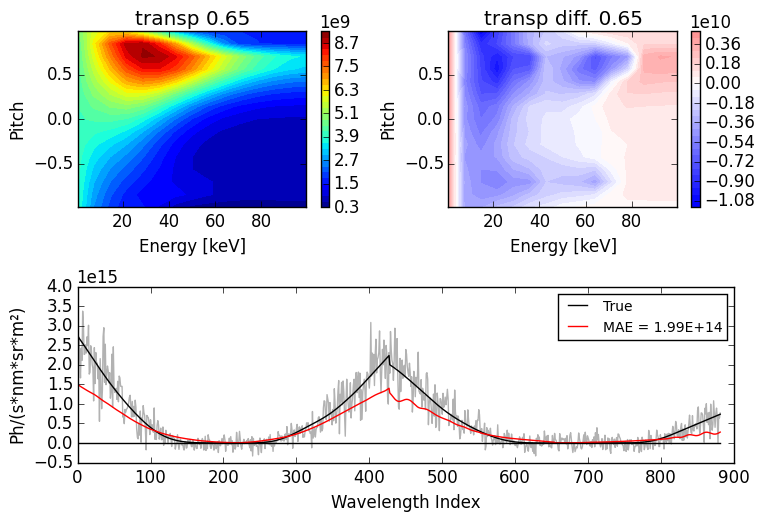

In [104]:
min_fisher_analysis("transp","d3d",elevel=14,doplot=true);

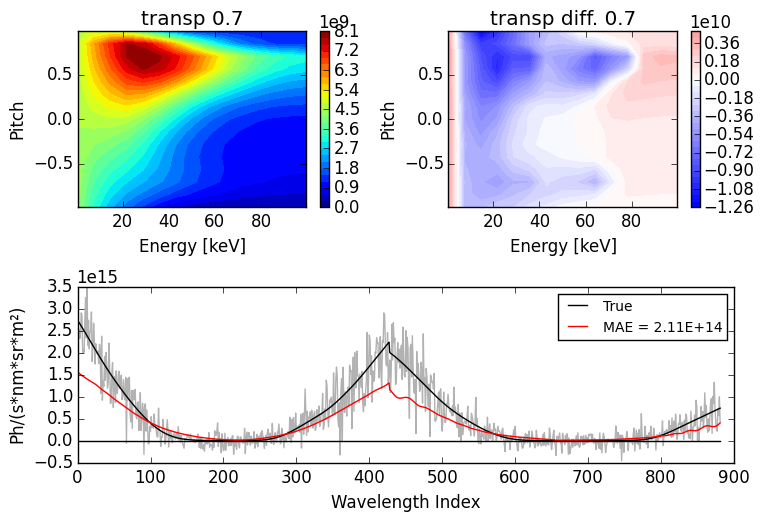

In [105]:
min_fisher_analysis("transp","d3d",elevel=15,doplot=true);

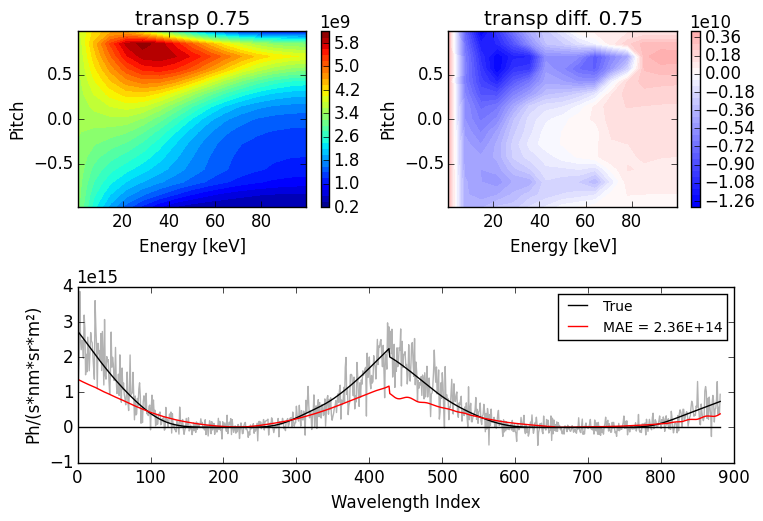

In [106]:
min_fisher_analysis("transp","d3d",elevel=16,doplot=true);

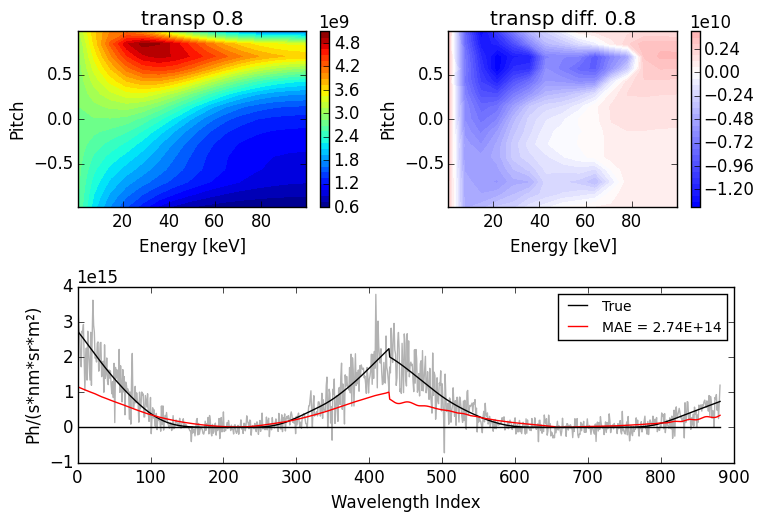

In [107]:
min_fisher_analysis("transp","d3d",elevel=17,doplot=true);

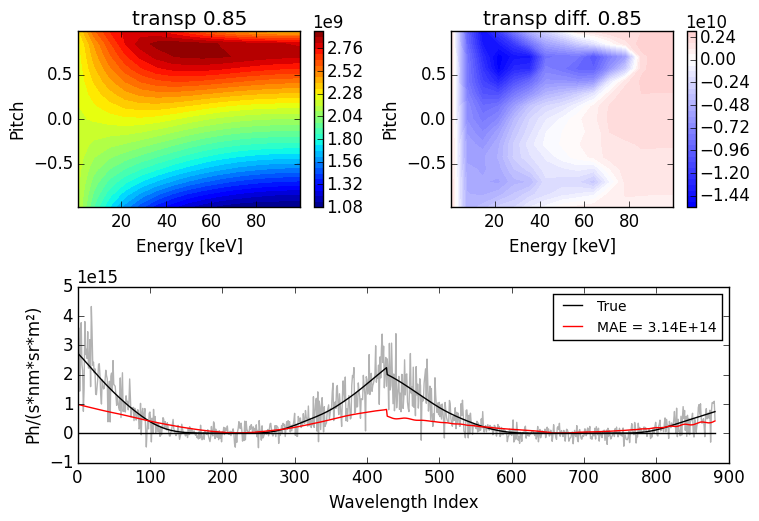

In [108]:
min_fisher_analysis("transp","d3d",elevel=18,doplot=true);

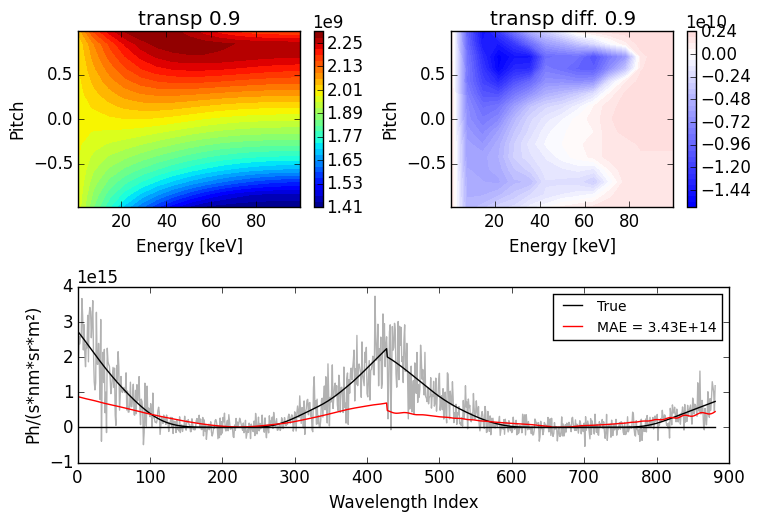

In [109]:
min_fisher_analysis("transp","d3d",elevel=19,doplot=true);

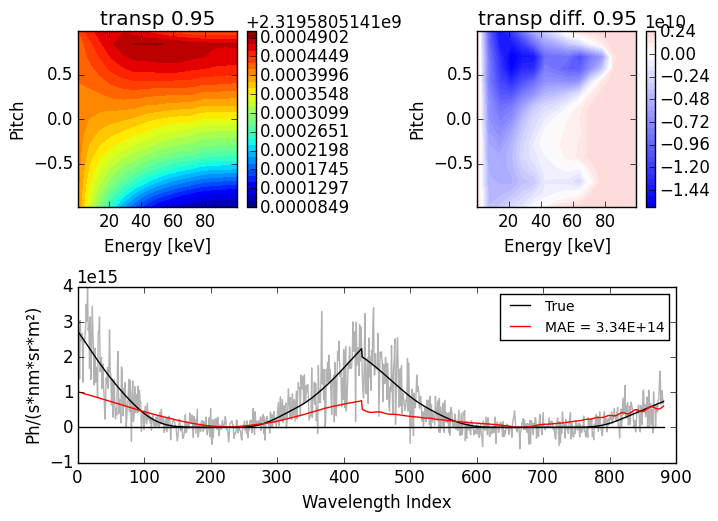

In [110]:
min_fisher_analysis("transp","d3d",elevel=20,doplot=true);

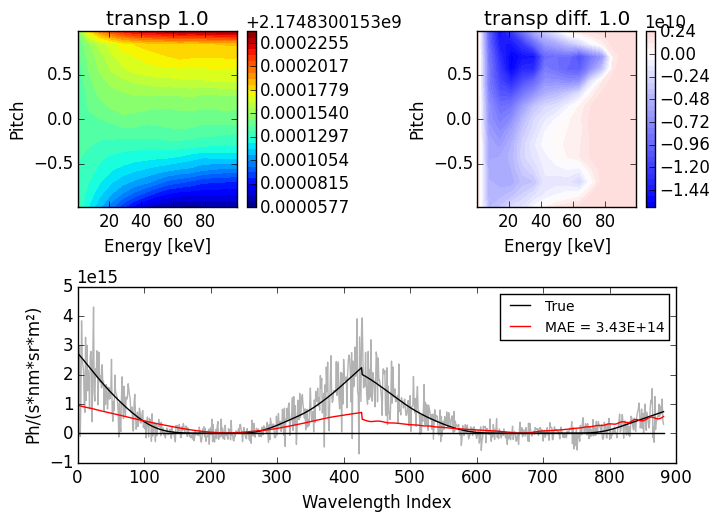

In [111]:
min_fisher_analysis("transp","d3d",elevel=21,doplot=true);

In [112]:
transp_dens = zeros(20);
transp_f = zeros(15*15,20);
transp_diff  = zeros(15*15,20);

In [113]:
for i=2:21
    transp_f[:,i-1],transp_diff[:,i-1],transp_dens[i-1] = min_fisher_analysis("transp","d3d",elevel=i);
end

In [114]:
wf   = read_ncdf("data/d3d_transfer_matrix.cdf");
A_full = wf["transfer_matrix"]
energy_full = wf["energy"]
pitch_full  = wf["pitch"]

A,energy,pitch = resizeTransferMatrix(A_full,energy_full,pitch_full,15,15);

In [115]:
nrows,ncols = size(A)
nerrs = 20
nenergy = length(energy)
npitch = length(pitch)

using NetCDF

# Write transfer matrix to file
fname = "data/d3d_min_fisher.cdf"

isfile(fname) && rm(fname)

nerr_id = NcDim("nerr",nerrs)
ncols_id = NcDim("ncols",ncols)
nrows_id = NcDim("nrows",nrows)
e_id = NcDim("nenergy",nenergy)
p_id = NcDim("npitch",npitch)

A_varid = NcVar("A",[nrows_id,ncols_id])
e_varid = NcVar("energy",e_id)
p_varid = NcVar("pitch",p_id)

flat_f_varid = NcVar("flat_f",[ncols_id,nerr_id])
blob_f_varid = NcVar("blob_f",[ncols_id,nerr_id])
blob6_f_varid = NcVar("blob6_f",[ncols_id,nerr_id])
bimax_f_varid = NcVar("bimax_f",[ncols_id,nerr_id])
transp_f_varid = NcVar("transp_f",[ncols_id,nerr_id])

flat_diff_varid = NcVar("flat_diff",[ncols_id,nerr_id])
blob_diff_varid = NcVar("blob_diff",[ncols_id,nerr_id])
blob6_diff_varid = NcVar("blob6_diff",[ncols_id,nerr_id])
bimax_diff_varid = NcVar("bimax_diff",[ncols_id,nerr_id])
transp_diff_varid = NcVar("transp_diff",[ncols_id,nerr_id])

flat_dens_varid = NcVar("flat_dens",nerr_id)
blob_dens_varid = NcVar("blob_dens",nerr_id)
blob6_dens_varid = NcVar("blob6_dens",nerr_id)
bimax_dens_varid = NcVar("bimax_dens",nerr_id)
transp_dens_varid = NcVar("transp_dens",nerr_id)

ncid = NetCDF.create(fname,[A_varid, e_varid,p_varid,
                            flat_f_varid,blob_f_varid,blob6_f_varid,bimax_f_varid,transp_f_varid,
                            flat_diff_varid,blob_diff_varid,blob6_diff_varid,bimax_diff_varid,transp_diff_varid,
                            flat_dens_varid,blob_dens_varid,blob6_dens_varid,bimax_dens_varid,transp_dens_varid])

NetCDF.putvar(ncid,"A",A)
NetCDF.putvar(ncid,"energy",energy)
NetCDF.putvar(ncid,"pitch",pitch)

NetCDF.putvar(ncid,"flat_f",flat_f)
NetCDF.putvar(ncid,"blob_f",blob_f)
NetCDF.putvar(ncid,"blob6_f",blob6_f)
NetCDF.putvar(ncid,"bimax_f",bimax_f)
NetCDF.putvar(ncid,"transp_f",transp_f)

NetCDF.putvar(ncid,"flat_diff",flat_diff)
NetCDF.putvar(ncid,"blob_diff",blob_diff)
NetCDF.putvar(ncid,"blob6_diff",blob6_diff)
NetCDF.putvar(ncid,"bimax_diff",bimax_diff)
NetCDF.putvar(ncid,"transp_diff",transp_diff)

NetCDF.putvar(ncid,"flat_dens",flat_dens)
NetCDF.putvar(ncid,"blob_dens",blob_dens)
NetCDF.putvar(ncid,"blob6_dens",blob6_dens)
NetCDF.putvar(ncid,"bimax_dens",bimax_dens)
NetCDF.putvar(ncid,"transp_dens",transp_dens)

NetCDF.close(ncid)

65536